In [ ]:
import numpy as np
import cv2
from numpy.linalg import inv

import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
from matplotlib.animation import FuncAnimation

import pickle
import os
import random

In [ ]:
# Set default font properties using rcParams
plt.rcParams['font.family'] = 'sans-serif'  # Set default font family
plt.rcParams['font.size'] = 18        # Set default font size
plt.rcParams['font.weight'] = 'normal' # Set default font weight
plt.rcParams['font.style'] = 'oblique'  # Set default font style

# Now all plots created in this file will use the specified default font properties

# Barrio-Varea-Aragon-Maini (BVAM) model
The model is
$$
\frac{\partial u}{\partial t}= D\nabla^2u+\eta(u+av-Cuv-uv^2)
$$
$$
\frac{\partial v}{\partial t}= \nabla^2v+\eta(bv+Hu+Cuv+uv^2)
$$

where $\eta=1, a=-1, b=-3/2$. $D,C,H$ are parameters need to be tuned. Scalar absolute and relative tolerances of 1e−9 were used, and $\Delta$t = 0.01. We set N = 50 and $\Delta$x =0.2; thus, the system size is L = 9.8.
\
\
Note:\
Using periodic boundary condition \
$C$ takes nagetive values while in the thesis we used $-C$ which takes positive values.
\
\
The stochastic model is:\
\begin{align}
\frac{\mathbf{u}_{n+1}-\mathbf{u}_n}{\Delta t} &= D\nabla^2\mathbf{u}_n+\mathbf{u}_n-\mathbf{v}_n+C\mathbf{u}_n\mathbf{v}_n-\mathbf{u}_n\mathbf{v}_n^2+\sqrt{\frac{2\epsilon D}{\Delta t}}\ \sigma_u(x,t) \\
\frac{\mathbf{v}_{n+1}-\mathbf{v}_n}{\Delta t} &= \nabla^2\mathbf{v}_n-\frac{3}{2}\mathbf{v}_n+H\mathbf{u}_n-C\mathbf{u}_n\mathbf{v}_n+\mathbf{u}_n\mathbf{v}_n^2+\sqrt{\frac{2\epsilon D}{\Delta t}}\ \sigma_v(x,t)
\end{align}

## Finite Differnce Scheme (Explicit and Periodic)
central difference in space and explicit in time.
$$
\begin{aligned}
\frac{u_{i,n+1} - u_{i,n}}{\Delta t} = D \frac{u_{i+1,n} - 2u_{i,n} + u_{i-1,n}}{(\Delta x)^2} + \eta(u_{i,n}+av_{i,n}-Cu_{i,n}v_{i,n}-u_{i,n}v_{i,n}^2) \\
\frac{v_{i,n+1} - v_{i,n}}{\Delta t} = \frac{v_{i+1,n} - 2v_{i,n} + v_{i-1,n}}{(\Delta x)^2} + \eta(bv_{i,n}+Hu_{i,n}+Cu_{i,n}v_{i,n}+u_{i,n}v_{i,n}^2)\\
\end{aligned}
$$
Rewrite as
$$
\begin{aligned}
u_{i,n+1} = \alpha u_{i+1,n}+(1- 2\alpha) u_{i,n} + \alpha u_{i-1,n} +\Delta t\eta(u_{i,n}+av_{i,n}-Cu_{i,n}v_{i,n}-u_{i,n}v_{i,n}^2) \\
v_{i,n+1} = \beta v_{i+1,n}+(1- 2\beta) v_{i,n} + \beta v_{i-1,n} +\Delta t\eta(bv_{i,n}+Hu_{i,n}+Cu_{i,n}v_{i,n}+u_{i,n}v_{i,n}^2) \\
\end{aligned}
$$

where we have defined $\alpha = D \Delta t/(\Delta x)^2$ and $\beta = \Delta t/(\Delta x)^2$. We conclude that this numerical scheme can be written in matrix form as
$$
\begin{aligned}
\mathbf{u}_{n+1} = A \mathbf{u}_n + \Delta t \eta \mathbf{a}_n \\
\mathbf{v}_{n+1} = B \mathbf{v}_n + \Delta t \eta \mathbf{b}_n
\end{aligned}
$$

where we have defined
$$
A = \begin{pmatrix}
1-2\alpha & \alpha & 0  & 0  & \alpha \\
\alpha & 1-2\alpha & \alpha & 0  & 0 \\
0 & \alpha & 1-2\alpha  & \alpha  & 0 \\
0 & 0 &  \alpha & 1-2\alpha  & \alpha \\
\alpha & 0 &  0 & \alpha  & 1-2\alpha
\end{pmatrix}
$$
and
$$
B = \begin{pmatrix}
1-2\beta & \beta & 0  & 0  & \beta \\
\beta & 1-2\beta & \beta & 0  & 0 \\
0 & \beta & 1-2\beta  & \beta  & 0 \\
0 & 0 &  \beta & 1-2\beta  & \beta \\
\beta & 0 &  0 & \beta  & 1-2\beta
\end{pmatrix}
$$

In [ ]:
def noise_generator(shape, mean=0, sd=1):
    '''
    generate noise
    noise follows Gaussion distribution
    shape: needs tuple input
    '''
    return np.random.normal(loc=mean, scale=sd, size=shape)

In [ ]:
def BVAM(par, eta=1, alpha = -1, beta = -3/2, epsilon=1e-4, noise=None):
    # Domain definition
    L = par.L
    N = par.N
    Nt = par.Nt
    H = par.H
    C = par.C
    D = par.D
    dt = par.dt
    dx = par.dx

    u0 = np.abs(0.01*np.random.rand(N))
    v0 = np.abs(0.01*np.random.rand(N))

    # Prepare the data structure
    ts = np.linspace(0,dt*Nt,Nt+1)
    xs = np.linspace(0,L,N)
    r, s = (len(xs),len(ts))
    us = np.zeros((r, s))
    vs = np.zeros((r, s))

    # Initialize the system with initial conditions
    us[:,0] = u0
    vs[:,0] = v0
    u = u0
    v = v0

    # Noise
    if noise == None:
        u_noi = noise_generator((r, s))
        v_noi = noise_generator((r, s))
    elif noise == False:
        u_noi = np.zeros((r, s))
        v_noi = np.zeros((r, s))
    else:
        u_noi, v_noi = noise

    # Define matrices
    a = D*dt/dx**2
    d1 = np.diag(     a*np.ones(N-1),-1)
    d2 = np.diag((1-2*a)*np.ones(N  ), 0)
    d3 = np.diag(     a*np.ones(N-1),+1)
    A = d1 + d2 + d3
    A[0,-1]= a
    A[-1,0]= a

    b = dt/dx**2
    d1 = np.diag(     b*np.ones(N-1),-1)
    d2 = np.diag((1-2*b)*np.ones(N  ), 0)
    d3 = np.diag(     b*np.ones(N-1),+1)
    B = d1 + d2 + d3
    B[0,-1]= b
    B[-1,0]= b

    # For loop over time to advance the solution
    for iT in range(1,Nt+1):
        # Reaction terms
        f = u + alpha*v - C*u*v - u*v**2
        g = beta*v + H*u + C*u*v + u*v**2
        u_new = np.matmul(A,u) + dt*eta*f + np.sqrt(2*epsilon*dt)*u_noi[:,iT]
        v_new = np.matmul(B,v) + dt*eta*g + np.sqrt(2*epsilon*dt)*v_noi[:,iT]

        u = u_new
        v = v_new
        us[:,iT] = u
        vs[:,iT] = v

    return xs,ts,us,vs

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 15000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

## Simulations Across Different Values of $C$

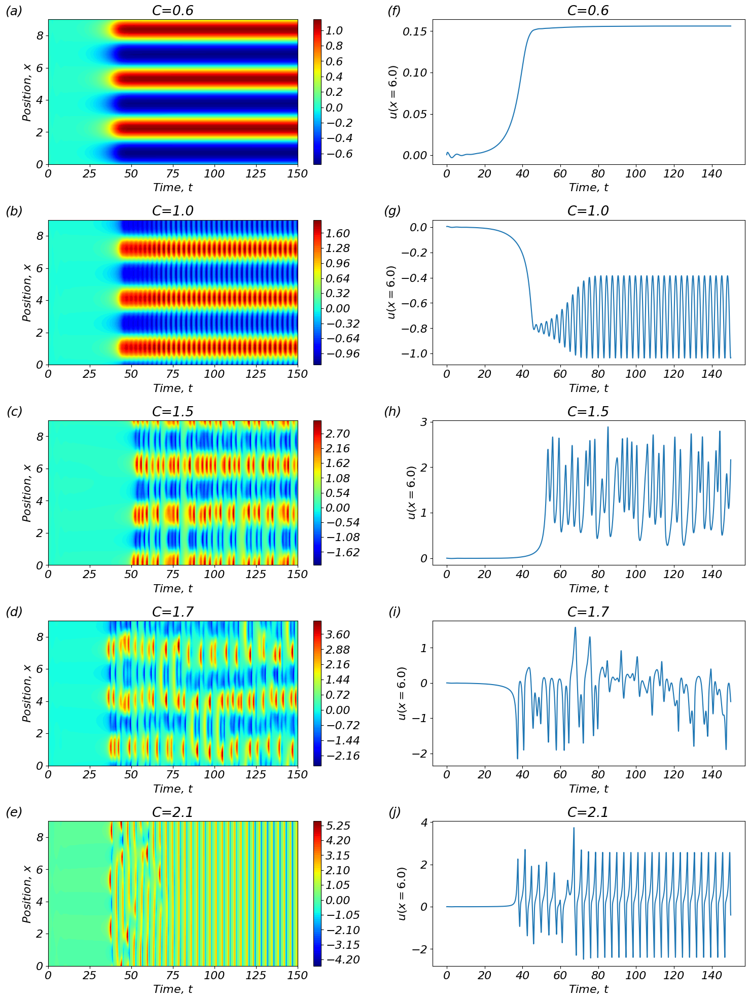

In [ ]:
Cval1 = np.array([-0.6, -1, -1.5, -1.7, -2.1])

fig, ax1 = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

for i, c in enumerate(Cval1):
    par.C = c
    xs1,ts1,us1,vs1 = BVAM(par, noise=False)
    T, X = np.meshgrid(ts1, xs1)

    c1 = ax1[i,0].contourf(T, X, us1, 100, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(r'C=%s'%(-c))
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    ax1[i,1].plot(ts1,us1[30])
    ax1[i,1].set_title(r'C=%s'%(-c))
    ax1[i,1].set_ylabel(r'$u(x=6.0)$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i, 0].text(-0.1, 1.1, f'({chr(97 + i)})', transform=ax1[i, 0].transAxes,
                   fontsize=18, fontweight='normal', va='top', ha='right')
    ax1[i, 1].text(-0.1, 1.1, f'({chr(97 + i+5)})', transform=ax1[i, 1].transAxes,
                   fontsize=18, fontweight='normal', va='top', ha='right')

# fig.suptitle(r"$\Delta t = 0.01$", fontsize = 18)
fig.tight_layout()
plt.show()

## Phase Portrait
$1.5 <H<3.8$. In this interval $D_c$ decreases monotonically.

Two types of behaviours show at $C=-1.5$.

In [ ]:
par.Nt = 100000
c_array = np.array([-1.21, -1.285, -1.5, -2.1])

<Figure size 640x480 with 0 Axes>

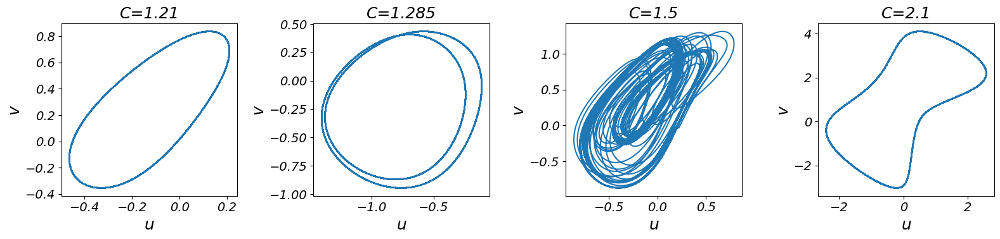

In [ ]:
STORE1 = []

fig1=plt.figure(1)
fig1,ax1 = plt.subplots(nrows=1, ncols=4, figsize=(16,4))

for i, b in enumerate(c_array):
    par.C = b
    xs1,ts1,us1,vs1 = BVAM(par, noise=False)
    STORE1.append([us1, vs1])
    ax1[i].plot(us1[23,50000:],vs1[23,50000:])
    ax1[i].set_title(f'C={-b}',fontsize=18)
    ax1[i].set_xlabel('u',fontsize=18)
    ax1[i].set_ylabel('v',fontsize=18)

fig1.tight_layout()

<Figure size 640x480 with 0 Axes>

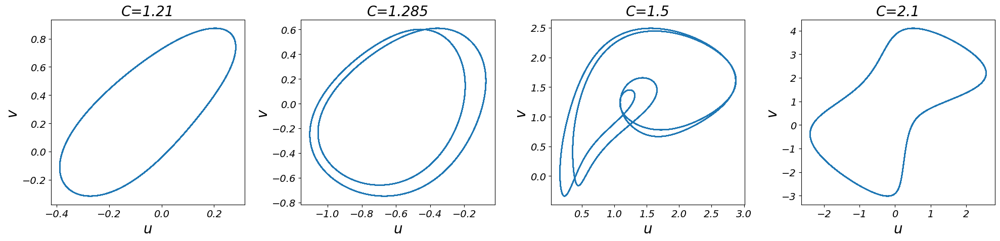

In [ ]:
c_array = np.array([-1.21, -1.285, -1.5, -2.1])
STORE2 = []

fig1=plt.figure(1)
fig1,ax1 = plt.subplots(nrows=1, ncols=4, figsize=(20,5))

for i, b in enumerate(c_array):
    par.C = b
    xs1,ts1,us1,vs1 = BVAM(par, noise=False)
    STORE2.append([us1, vs1])
    ax1[i].plot(us1[25,80000:],vs1[25,80000:])
    ax1[i].set_title(f'C={-b}',fontsize=20)
    ax1[i].set_xlabel('u',fontsize=20)
    ax1[i].set_ylabel('v',fontsize=20)

fig1.tight_layout()

## Video Generator

Set $H=3, D = 0.08$, varying $C$ from $-0.1$ to $-2$

In [ ]:
par.dt = 0.01
par.H = 3
par.D = 0.08
par.Nt = 15000

In [ ]:
C_val2 = np.linspace(-0.1,-2.1,21)

# Set up the plot
fig, ax = plt.subplots()
num_levels = 100
video_name = "varying_C_video.avi"
img_array = []

# Plot contours for each time step
for i,c in enumerate(C_val2):
    par.C = c
    xs1,ts1,us1,vs1 = BVAM(par)
    T, X = np.meshgrid(ts1, xs1)
    ax.contourf(T, X, us1, levels=num_levels, cmap="jet")
    ax.set_title('C=%s'%c,fontsize=18)
    plt.savefig(f"frame_{i:04d}.png")
    img = cv2.imread(f"frame_{i:04d}.png")
    img_array.append(img)

height, width, _ = img_array[0].shape
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(video_name, fourcc, 1, (width, height))

# Write each frame to the video
for i in range(len(img_array)):
    out.write(img_array[i])

# Release the VideoWriter and close the plot
out.release()
plt.close()

## Simulations: Stochastic BVAM

In [ ]:
class params:
    pass

par = params()
par.L = 9.8
par.N = 50
par.Nt = 15000
par.dt = 0.01
par.dx = 0.2
par.u0 = np.abs(0.01*np.random.rand(par.N))
par.v0 = np.abs(0.01*np.random.rand(par.N))
par.H = 3
par.D = 0.08

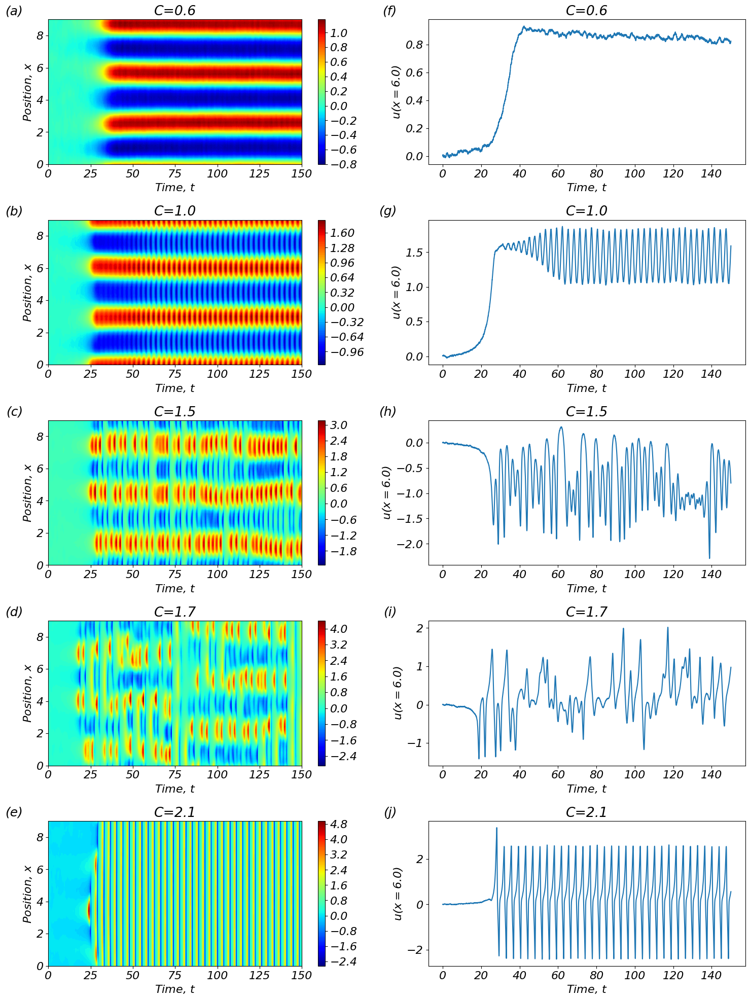

In [ ]:
Cval1 = np.array([-0.6, -1, -1.5, -1.7, -2.1])

fig, ax1 = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

for i, c in enumerate(Cval1):
    par.C = c
    xs1,ts1,us1,vs1 = BVAM(par, noise=None)
    T, X = np.meshgrid(ts1, xs1)

    c1 = ax1[i,0].contourf(T, X, us1, 100, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(r'C=%s'%(-c))
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    ax1[i,1].plot(ts1,us1[30])
    ax1[i,1].set_title(r'C=%s'%(-c))
    ax1[i,1].set_ylabel(r'$u(x=6.0)$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i, 0].text(-0.1, 1.1, f'({chr(97 + i)})', transform=ax1[i, 0].transAxes,
                   fontsize=18, fontweight='normal', va='top', ha='right')
    ax1[i, 1].text(-0.1, 1.1, f'({chr(97 + i+5)})', transform=ax1[i, 1].transAxes,
                   fontsize=18, fontweight='normal', va='top', ha='right')

# fig.suptitle(r"$\Delta t = 0.01$", fontsize = 18)
fig.tight_layout()
plt.show()

## Comparing Deterministic and Stochastic Dynamics When $C \geq -1.5$

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 150000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
Cval1 = np.linspace(-1.4, -2.3, 10)

u_list = []
v_list = []
u_list_noise = []
v_list_noise = []
u_list_noise_2 = []
v_list_noise_2 = []

for c in Cval1:
    par.C = c
    x,t,u,v = BVAM(par, noise=False)
    u_list.append(u)
    v_list.append(v)
    x,t,u,v = BVAM(par, noise=None)
    u_list_noise.append(u)
    v_list_noise.append(v)
    x,t,u,v = BVAM(par, noise=None, epsilon=1e-3)
    u_list_noise_2.append(u)
    v_list_noise_2.append(v)

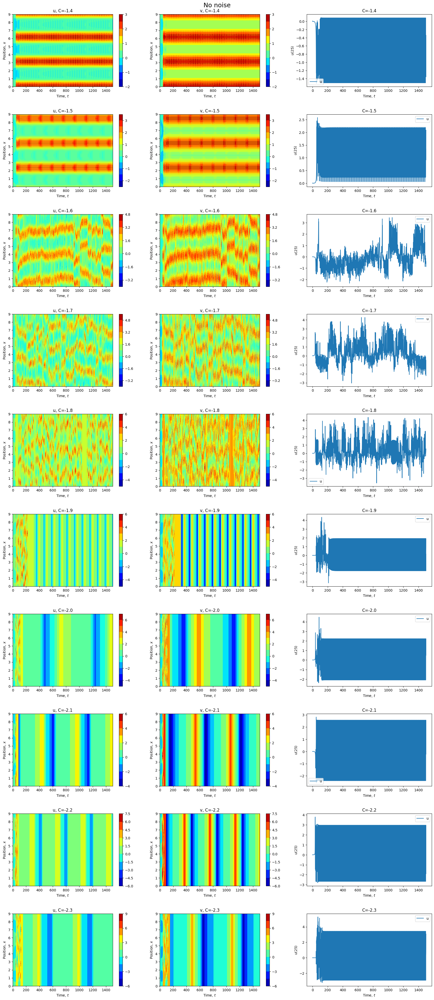

In [ ]:
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t, x)

for i, c in enumerate(Cval1):
    us1 = u_list[i]
    vs1 = v_list[i]
    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t,us1[25],label='u')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"No noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

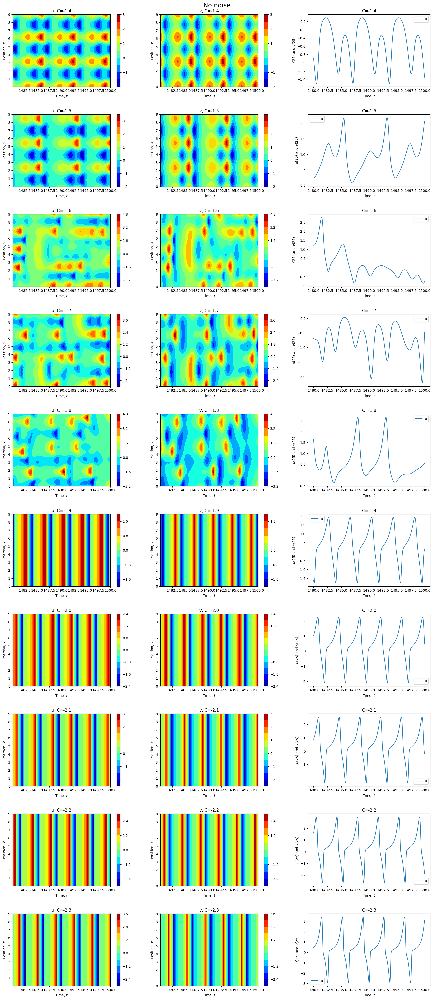

In [ ]:
# Zoom In plot
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t[-2000:], x)

for i, c in enumerate(Cval1):
    us1 = u_list[i][:, -2000:]
    vs1 = v_list[i][:, -2000:]
    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t[-2000:],us1[25],label='u')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"No noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

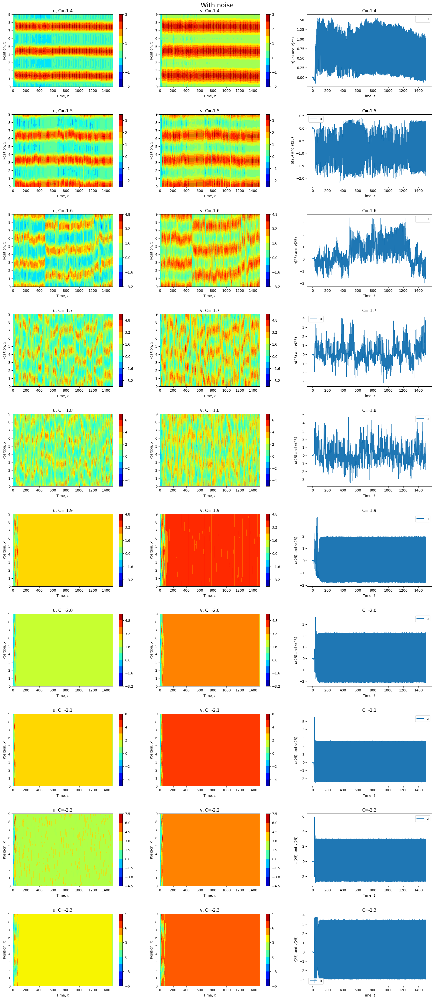

In [ ]:
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t, x)

for i, c in enumerate(Cval1):
    us1 = u_list_noise[i]
    vs1 = v_list_noise[i]

    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t,us1[25],label='u')
    # ax1[i,2].plot(t,vs1[25],label='v')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"With noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

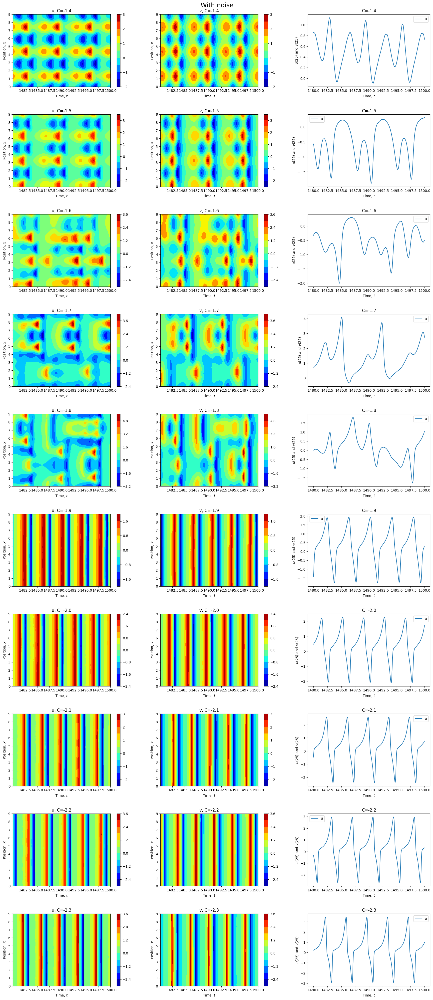

In [ ]:
# Zoom In plot
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t[-2000:], x)

for i, c in enumerate(Cval1):
    us1 = u_list_noise[i][:,-2000:]
    vs1 = v_list_noise[i][:,-2000:]

    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t[-2000:],us1[25],label='u')
    # ax1[i,2].plot(t,vs1[25],label='v')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"With noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

### Stronger Noise ?

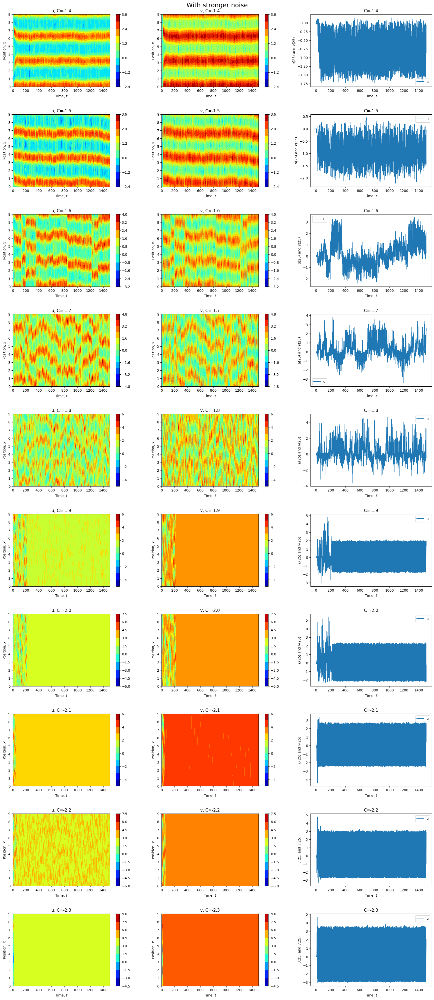

In [ ]:
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t, x)

for i, c in enumerate(Cval1):
    us1 = u_list_noise_2[i]
    vs1 = v_list_noise_2[i]

    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t,us1[25],label='u')
    # ax1[i,2].plot(t,vs1[25],label='v')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"With stronger noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

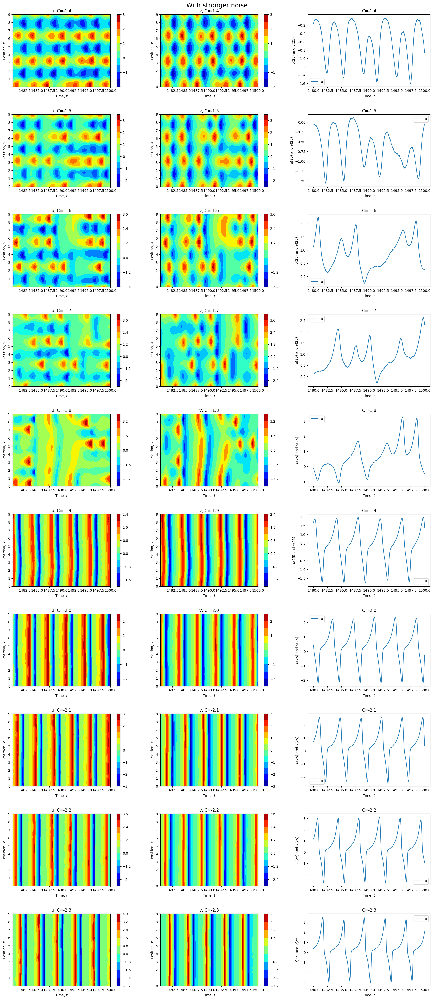

In [ ]:
# Zoom In plot
n = len(Cval1)
fig, ax1 = plt.subplots(nrows=n, ncols=3, figsize=(18, 4*n+1))
T, X = np.meshgrid(t[-2000:], x)

for i, c in enumerate(Cval1):
    us1 = u_list_noise_2[i][:,-2000:]
    vs1 = v_list_noise_2[i][:,-2000:]

    c1 = ax1[i,0].contourf(T, X, us1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,0])
    ax1[i,0].set_title(f'u, C={c:.1f}')
    ax1[i,0].set_ylabel(r'Position, $x$')
    ax1[i,0].set_xlabel(r'Time, $t$')
    c2 = ax1[i,1].contourf(T, X, vs1, 10, cmap ="jet")
    cbar1 = fig.colorbar(c1,ax=ax1[i,1])
    ax1[i,1].set_title(f'v, C={c:.1f}')
    ax1[i,1].set_ylabel(r'Position, $x$')
    ax1[i,1].set_xlabel(r'Time, $t$')

    ax1[i,2].plot(t[-2000:],us1[25],label='u')
    # ax1[i,2].plot(t,vs1[25],label='v')
    ax1[i,2].set_title(f'C={c:.1f}')
    ax1[i,2].set_ylabel(r'$u(25)$')
    ax1[i,2].set_xlabel(r'Time, $t$')
    ax1[i,2].legend()

fig.suptitle(r"With stronger noise",fontsize = 18)
fig.tight_layout(pad=3.0)
plt.show()

# Entropy Production Rate

$$
\begin{align}
    \dot{\mathcal{S}} = -\lim _{\tau \rightarrow \infty} \frac{1}{D\tau} \int_0^\tau dt \int dx \sum^{N=2}_{i=1} \left\langle
    \dot{\phi}_i(x, t) \cdot \mu_i(x,t)\right\rangle
\end{align}
$$

$$
\frac{\partial u}{\partial t}= D\nabla^2u+\eta(u+av-Cuv-uv^2)
$$
$$
\frac{\partial v}{\partial t}= \nabla^2v+\eta(bv+Hu+Cuv+uv^2)
$$

$$
\dot{\phi}_u(x, t) = \frac{\partial u}{\partial t} %= D\nabla^2u+\eta(u+av-Cuv-uv^2)
,
\dot{\phi}_v(x, t) = \frac{\partial v}{\partial t} %= \nabla^2v+\eta(bv+Hu+Cuv+uv^2)
$$

$$
\mu_u(x,t) = D\nabla^2u+\eta(u+av-Cuv-uv^2)
$$
$$
\mu_v(x,t) = \nabla^2v+\eta(bv+Hu+Cuv+uv^2)
$$

## Change to It&ocirc; integration

\begin{align}
    \dot{\mathcal{S}}  
    = \lim _{\tau \rightarrow \infty} \frac{1}{D\tau} \int_0^\tau dt \int dx\sum^N_{i=1} \left\langle \mu_i^2(x,t)\right\rangle
\end{align}

In [ ]:
class params:
    pass

par = params()
par.L = 9.8
par.N = 50
par.Nt = 20000
par.dt = 0.01
par.dx = 0.2
par.u0 = np.abs(0.01*np.random.rand(par.N))
par.v0 = np.abs(0.01*np.random.rand(par.N))
par.H = 3
par.D = 0.08

### Algorithm Implementation


In [ ]:
def sum_term(u, v, par, drop=int(3e5), mu_return=False):
  '''
  for one noise, calculate \dot{phi}_u*mu_u + \dot{phi}_v * mu_v
  drop the boundaries
  '''
  # parameters needed
  eta = 1
  alpha = -1
  beta = -3/2

  # diffusion term
  lap_u = (u[2:,:-1] -2*u[1:-1,:-1]+ u[:-2,:-1]) / (par.dx**2)
  lap_v = (v[2:,:-1] -2*v[1:-1,:-1]+ v[:-2,:-1]) / (par.dx**2)

  # mu: drop boundary
  u_nb = u[1:-1,:-1]
  v_nb = v[1:-1,:-1]

  mu_u = par.D * lap_u + eta * (u_nb + alpha*v_nb - par.C*u_nb*v_nb - u_nb*v_nb**2)
  mu_v = lap_v + eta * (beta*v_nb + par.H*u_nb + par.C*u_nb*v_nb + u_nb*v_nb**2)

  ito_sum = mu_u**2 + mu_v**2

  if mu_return:
    return ito_sum

  # split
  ito_sum_dropped = ito_sum[:,drop:]

  entropy = []
  for i in range(0, (par.Nt-drop), 2000):
    part_sum = np.sum(ito_sum_dropped[:,i:i+2000]) * par.dx
    entropy.append(part_sum)

  Sum = np.cumsum(np.array(entropy)) * par.dt

  return Sum

In [ ]:
def simulation(Nt, N_noise, C, drop=int(3e5), noise=None, para=par, STORE=False):
  '''
  mean_entropy_over_noise: entropy production rate we want
  entropy_values_store: each value is a entropy production rate for one realisation
  '''
  para.C = C
  para.Nt = Nt

  dim = int((Nt-drop)/2000)
  Values_store = np.zeros((N_noise, dim))

  store = {'u': [], 'v': []}

  if noise == None:
    for i in range(N_noise):
      # generate noise and store
      xs1,ts1,us1,vs1 = BVAM(para, noise=None)

      # calculate entropy production rate
      Sum1 = sum_term(us1, vs1, para, drop=drop)
      Values_store[i,:] = Sum1

      if STORE:
        # Store
        store['u'].append(us1[:, 0::10])
        store['v'].append(vs1[:, 0::10])

  store['t'] = ts1
  store['x'] = xs1

  # use Ito integral
  entropy_values_store = Values_store / (para.D * ts1[2000:(Nt-drop)+1:2000])
  mean_entropy_over_noise = np.mean(entropy_values_store, axis = 0)

  if STORE:
    return mean_entropy_over_noise, entropy_values_store, store
  else:
    return mean_entropy_over_noise, entropy_values_store

## Testing

When testing and exploring the simulations of EPR, we found interesting behaviours. The number of stripes in the patterns could be different under same conditions. (See section wavelength analysis)

In [ ]:
S1, S_array_1, dict1 = simulation(Nt=400000, N_noise=10, C=-0.6, para=par, drop=int(1e5), STORE=True)

In [ ]:
S2, S_array_2, dict2 = simulation(Nt=400000, N_noise=10, C=-0.6, para=par, drop=int(1e5), STORE=True)

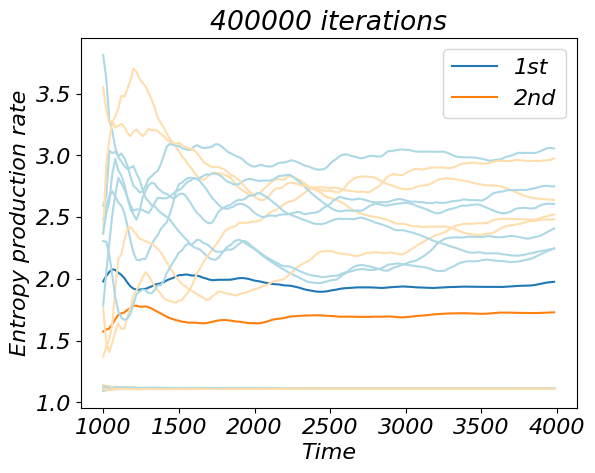

In [ ]:
min = 1e5 * par.dt
max = 4e5*par.dt
x_axis = np.arange(min, max, 20)

plt.plot(x_axis, S1, label='1st')
plt.plot(x_axis, S2, label='2nd')
for i in range(10):
  plt.plot(x_axis, S_array_1[i,:], color='lightblue')
  plt.plot(x_axis, S_array_2[i,:], color='navajowhite')

plt.title(f'{par.Nt} iterations')
plt.xlabel('Time')
plt.ylabel('Entropy production rate')
plt.legend()

Applying same conditions but distinct and independent noises, we found the realisations fall into two classes. Next, we would like to visualise them in order to investigate further.

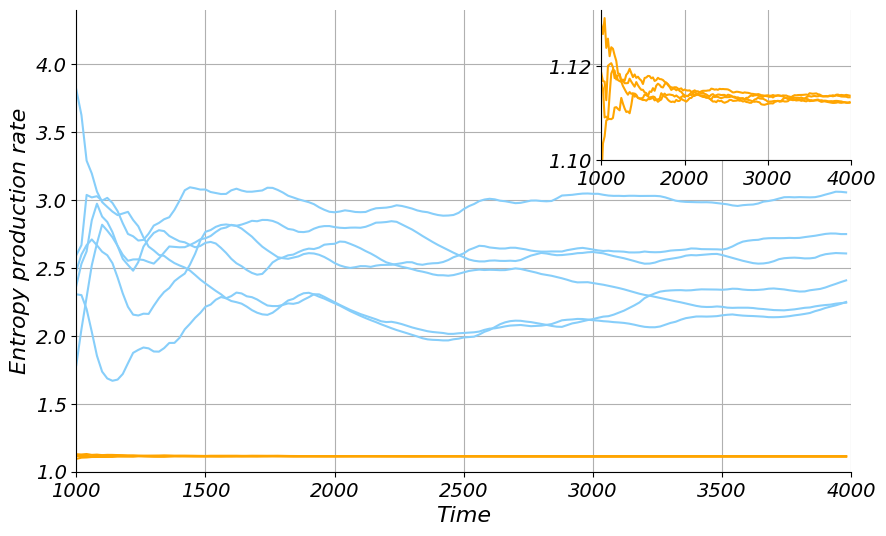

In [ ]:
# Figure
min = 1e5 * par.dt
max = 4e5 * par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(figsize=(10,6))
inset_ax = fig.add_axes([0.65, 0.63, 0.25, 0.25])

for i in range(10):
  if S_array_1[i,-1] > 1.5:
    ax.plot(x_axis, S_array_1[i,:], color='lightskyblue')
  else:
    ax.plot(x_axis, S_array_1[i,:], color='orange')
    inset_ax.plot(x_axis, S_array_1[i,:], color='orange')

inset_ax.set_ylim(1.100)
inset_ax.set_xlim(1000, 4000)

ax.set_ylim(1,4.4)
ax.set_xlim(1000, 4000)
ax.set_xlabel('Time', fontsize = 16)
ax.set_ylabel('Entropy production rate', fontsize = 16)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
inset_ax.spines['top'].set_visible(False)
inset_ax.spines['right'].set_visible(False)

ax.grid()
inset_ax.grid()

In [ ]:
# find the indices of the lower class
raw_index = np.where(S_array_1 < 1.2)[0]
index = np.unique(raw_index)

raw_index = np.where(S_array_1 > 1.2)[0]
index2 = np.unique(raw_index)

print(index)
print(len(index))
print(len(index2))

# find the indices of the upper class
raw_index = np.where(S_array_2 < 1.2)[0]
index3 = np.unique(raw_index)

raw_index = np.where(S_array_2 > 1.2)[0]
index4 = np.unique(raw_index)

print(index3)
print(len(index3))
print(len(index4))

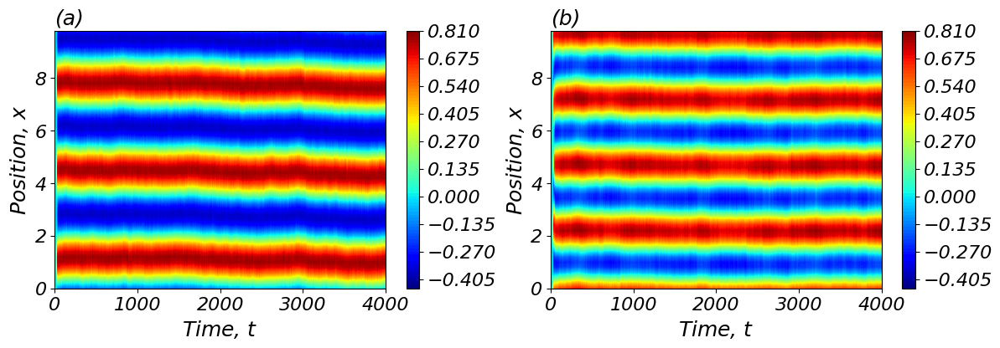

In [ ]:
# plot
v_list = dict1['v']
T, X = np.meshgrid(dict1['t'][0::10], dict1['x'])
n = len(index)

fig, ax1 = plt.subplots(nrows=1, ncols=2, figsize=(14, 4))

c2 = ax1[0].contourf(T, X, v_list[index[0]], 100, cmap ="jet")
c2 = ax1[1].contourf(T, X, v_list[index2[0]], 100, cmap ="jet")

cbar2 = fig.colorbar(c2,ax=ax1[0])
cbar2 = fig.colorbar(c2,ax=ax1[1])
ax1[0].set_title(r'(a)', loc='left', fontsize = 18)
ax1[0].set_ylabel(r'Position, $x$', fontsize = 18)
ax1[0].set_xlabel(r'Time, $t$', fontsize = 18)
ax1[1].set_title(r'(b)', loc='left', fontsize = 18)
ax1[1].set_ylabel(r'Position, $x$', fontsize = 18)
ax1[1].set_xlabel(r'Time, $t$', fontsize = 18)

plt.show()

### Finding the Length of Box (Numerical)

In [ ]:
# Try different parameters
class params:
    pass
par3 = params()
par3.L = 19.8
par3.N = 100
par3.dt = 0.01
par3.dx = 0.2
par3.H = 3
par3.D = 0.08

class params:
    pass
par1 = params()
par1.L = 14.8
par1.N = 75
par1.dt = 0.01
par1.dx = 0.2
par1.H = 3
par1.D = 0.08

class params:
    pass
par2 = params()
par2.L = 24.8
par2.N = 125
par2.dt = 0.01
par2.dx = 0.2
par2.H = 3
par2.D = 0.08

class params:
    pass
par4 = params()
par4.L = 29.8
par4.N = 150
par4.dt = 0.01
par4.dx = 0.2
par4.H = 3
par4.D = 0.08

In [ ]:
S15, S_array_15, dict15 = simulation(Nt=400000, N_noise=10, para=par1, C=-0.6, drop=int(1e5), STORE=True)

In [ ]:
S20, S_array_20, dict20 = simulation(Nt=400000, N_noise=10, para=par3, C=-0.6, drop=int(1e5), STORE=True)

In [ ]:
S25, S_array_25, dict25 = simulation(Nt=400000, N_noise=10, para=par2, C=-0.6, drop=int(1e5), STORE=True)

In [ ]:
S30, S_array_30, dict30 = simulation(Nt=400000, N_noise=10, para=par4, C=-0.6, drop=int(1e5), STORE=True)

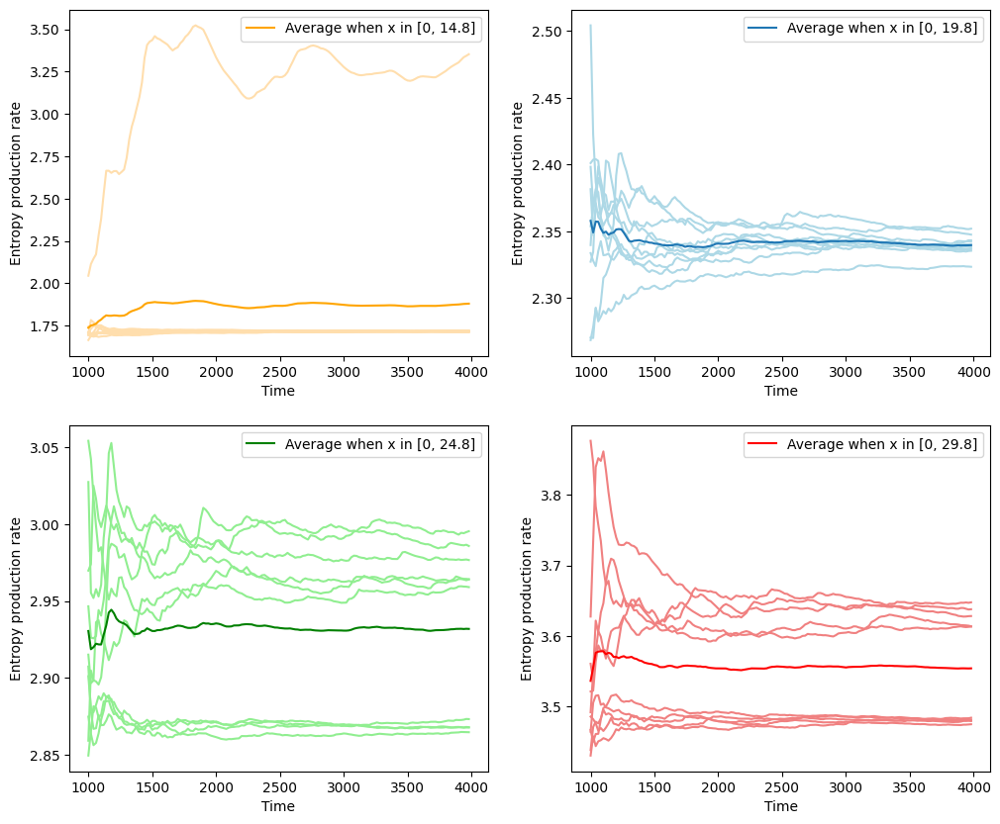

In [ ]:
min = 1e5 * par.dt
max = 4e5*par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

for i in range(10):
  ax[0,1].plot(x_axis, S_array_20[i,:], color='lightblue')
  ax[0,0].plot(x_axis, S_array_15[i,:], color='navajowhite')
  ax[1,0].plot(x_axis, S_array_25[i,:], color='lightgreen')
  ax[1,1].plot(x_axis, S_array_30[i,:], color='lightcoral')

ax[1,1].plot(x_axis, S30, color='red', label=f'Average when x in [0, {par4.L}]')
ax[1,0].plot(x_axis, S25, color='green', label=f'Average when x in [0, {par2.L}]')
ax[0,0].plot(x_axis, S15, color='orange',label=f'Average when x in [0, {par1.L}]')
ax[0,1].plot(x_axis, S20, label=f'Average when x in [0, {par3.L}]')

for j in range(2):
  ax[0,j].set_xlabel('Time')
  ax[0,j].set_ylabel('Entropy production rate')
  ax[0,j].legend()
  ax[1,j].set_xlabel('Time')
  ax[1,j].set_ylabel('Entropy production rate')
  ax[1,j].legend()

[0 1 2 3 4 5 8 9]
8
2


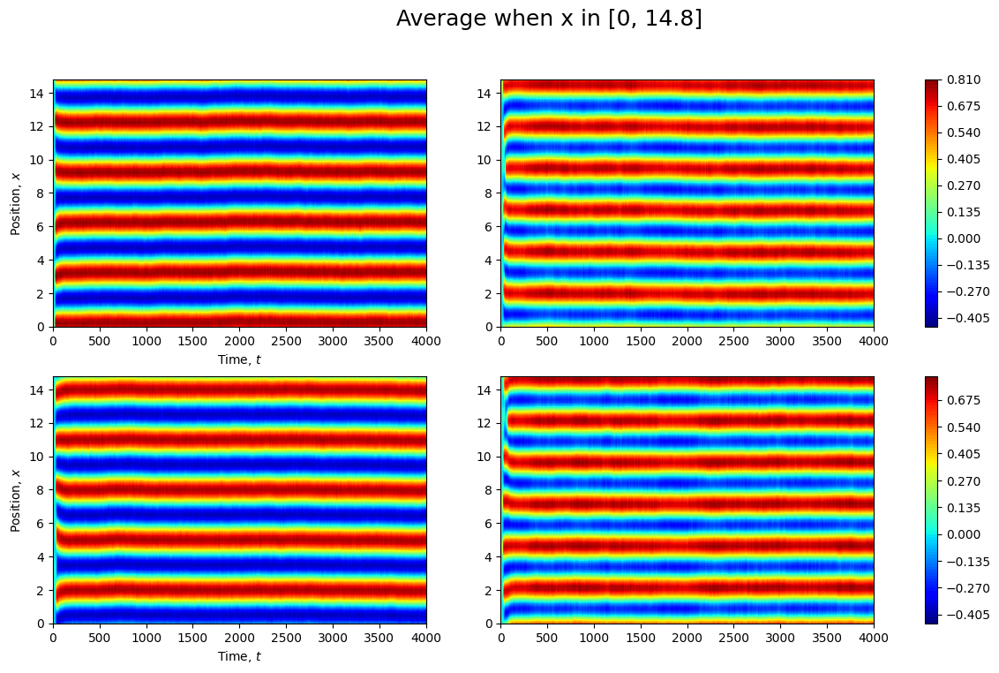

In [ ]:
# find the indices
raw_index = np.where(S_array_15 < 2.5)[0]
index1 = np.unique(raw_index)

raw_index = np.where(S_array_15 > 2.5)[0]
index2 = np.unique(raw_index)

print(index1)
print(len(index1))
print(len(index2))

# plot
# u_list = dict1['u']
v_list = dict15['v']
T, X = np.meshgrid(dict15['t'][0::10], dict15['x'])
n = len(index1)
nrows = 2
ncols = 2

fig, ax1 = plt.subplots(nrows, ncols, figsize=(15, 8))
for i in range(nrows):
  c2 = ax1[i, 0].contourf(T, X, v_list[index1[i]], 100, cmap ="jet")
  c2 = ax1[i, 1].contourf(T, X, v_list[index2[i]], 100, cmap ="jet")
  cbar2 = fig.colorbar(c2,ax=ax1[i])
  ax1[i,0].set_ylabel(r'Position, $x$')
  ax1[i,0].set_xlabel(r'Time, $t$')
  ax1[i,1].set_ylabel(r'Position, $x$')
  ax1[i,1].set_xlabel(r'Time, $t$')

fig.suptitle(f'Average when x in [0, {par1.L}]',fontsize = 18)
plt.show()

[2 4 5 7 9]
5
5


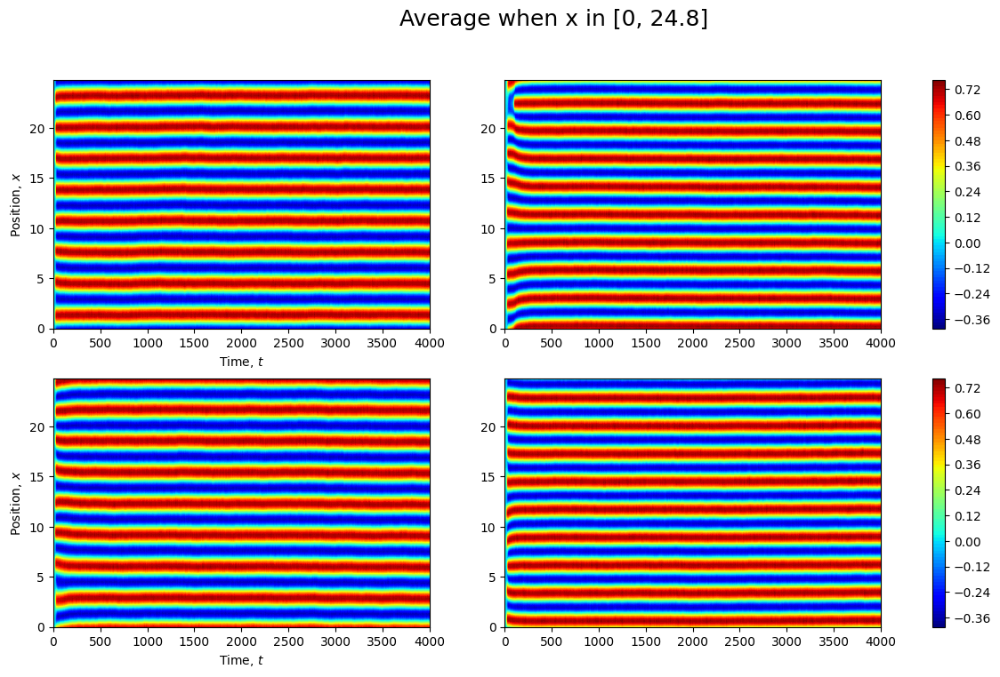

In [ ]:
# find the indices
raw_index = np.where(S_array_25 < 2.9)[0]
index3 = np.unique(raw_index)

raw_index = np.where(S_array_25 > 2.9)[0]
index4 = np.unique(raw_index)

print(index3)
print(len(index3))
print(len(index4))

# plot
# u_list = dict1['u']
v_list = dict25['v']
T, X = np.meshgrid(dict25['t'][0::10], dict25['x'])
n = len(index3)
nrows = 2
ncols = 2

fig, ax1 = plt.subplots(nrows, ncols, figsize=(15, 8))
for i in range(nrows):
  c2 = ax1[i, 0].contourf(T, X, v_list[index3[i]], 100, cmap ="jet")
  c2 = ax1[i, 1].contourf(T, X, v_list[index4[i]], 100, cmap ="jet")
  cbar2 = fig.colorbar(c2,ax=ax1[i])
  ax1[i,0].set_ylabel(r'Position, $x$')
  ax1[i,0].set_xlabel(r'Time, $t$')
  ax1[i,1].set_ylabel(r'Position, $x$')
  ax1[i,1].set_xlabel(r'Time, $t$')

fig.suptitle(f'Average when x in [0, {par2.L}]',fontsize = 18)
plt.show()

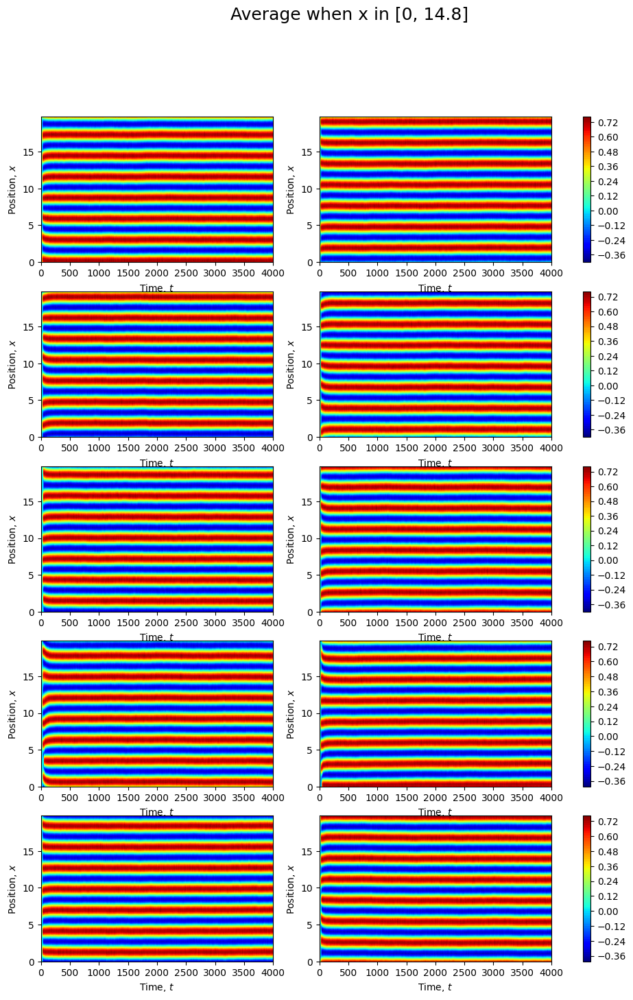

In [ ]:
# plot
# u_list = dict1['u']
v_list = dict20['v']
T, X = np.meshgrid(dict20['t'][0::10], dict20['x'])
nrows = 5
ncols = 2

fig, ax1 = plt.subplots(nrows, ncols, figsize=(12, 16))
for i in range(nrows):
  c2 = ax1[i, 0].contourf(T, X, v_list[i], 100, cmap ="jet")
  c2 = ax1[i, 1].contourf(T, X, v_list[i+5], 100, cmap ="jet")
  cbar2 = fig.colorbar(c2,ax=ax1[i])
  ax1[i,0].set_ylabel(r'Position, $x$')
  ax1[i,0].set_xlabel(r'Time, $t$')
  ax1[i,1].set_ylabel(r'Position, $x$')
  ax1[i,1].set_xlabel(r'Time, $t$')

fig.suptitle(f'Average when x in [0, {par1.L}]',fontsize = 18)
plt.show()

### Does $\dot{S}$ $\propto$ $L$?

In [ ]:
class params:
    pass

par = params()
# par.L = 9.8
# par.N = 50
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
par.L = 34.8
par.N = 175
S35, S_array_35, dict35 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5), STORE=True)

In [ ]:
par.L = 39.8
par.N = 200
S40, S_array_40 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5))

In [ ]:
par.L = 44.8
par.N = 225
S45, S_array_45 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5))

In [ ]:
par.L = 49.8
par.N = 250
S50, S_array_50 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5))

In [ ]:
par.L = 54.8
par.N = 275
S55, S_array_55 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5))

In [ ]:
par.L = 59.8
par.N = 300
S60, S_array_60 = simulation(Nt=400000, N_noise=10, para=par, C=-0.6, drop=int(1e5))

In [ ]:
# put them together
EPR_10_to_60_list = [S1]
for i in range(2, 12):
  array_name = f"S{5*i+5}"
  array = eval(array_name)
  EPR_10_to_60_list.append(array)

EPR_array = np.array(EPR_10_to_60_list)

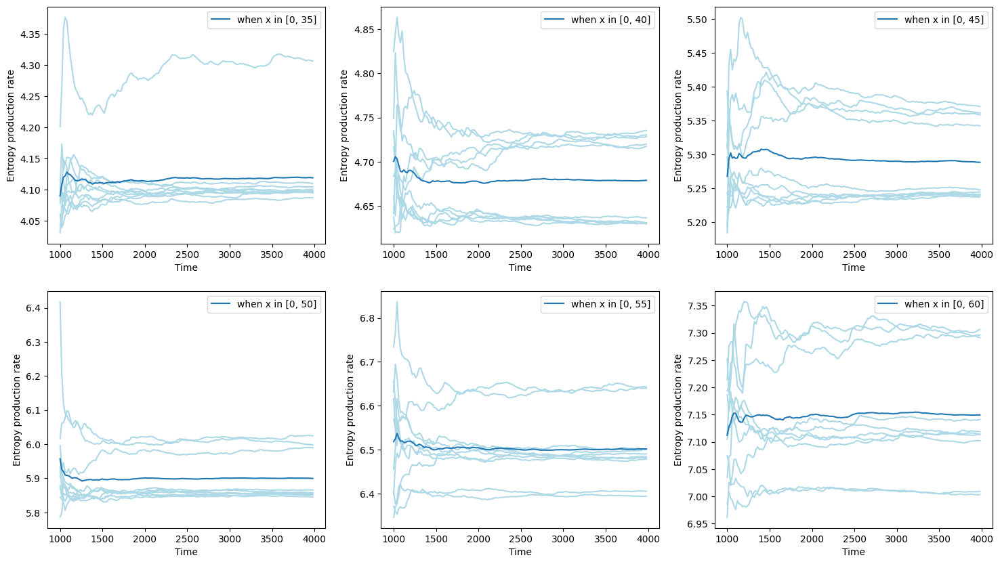

In [ ]:
min = 1e5 * par.dt
max = 4e5*par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for i in range(10):
  ax[0,0].plot(x_axis, S_array_35[i,:], color='lightblue')
  ax[0,1].plot(x_axis, S_array_40[i,:], color='lightblue')
  ax[0,2].plot(x_axis, S_array_45[i,:], color='lightblue')
  ax[1,0].plot(x_axis, S_array_50[i,:], color='lightblue')
  ax[1,1].plot(x_axis, S_array_55[i,:], color='lightblue')
  ax[1,2].plot(x_axis, S_array_60[i,:], color='lightblue')

ax[0,0].plot(x_axis, S35, label=f'when x in [0, 35]')
ax[0,1].plot(x_axis, S40, label=f'when x in [0, 40]')
ax[0,2].plot(x_axis, S45, label=f'when x in [0, 45]')
ax[1,0].plot(x_axis, S50, label=f'when x in [0, 50]')
ax[1,1].plot(x_axis, S55, label=f'when x in [0, 55]')
ax[1,2].plot(x_axis, S60, label=f'when x in [0, 60]')

for j in range(3):
  ax[0,j].set_xlabel('Time')
  ax[0,j].set_ylabel('Entropy production rate')
  ax[0,j].legend()
  ax[1,j].set_xlabel('Time')
  ax[1,j].set_ylabel('Entropy production rate')
  ax[1,j].legend()

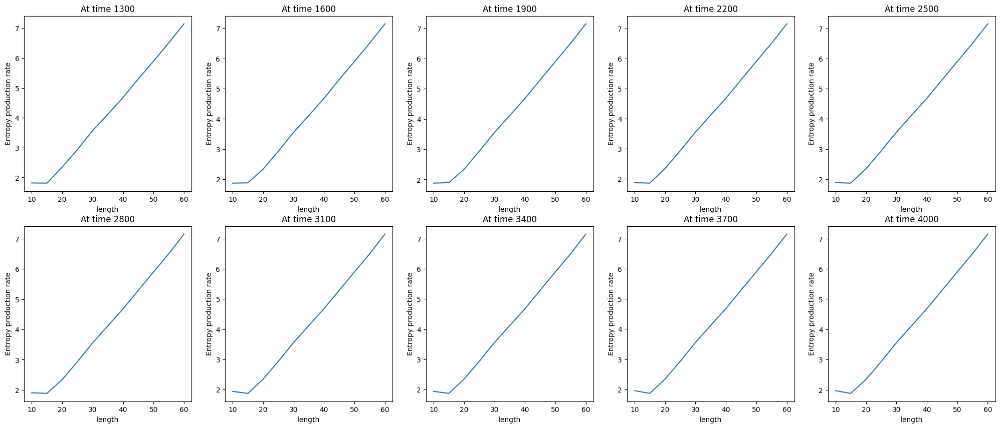

In [ ]:
length = np.arange(10, 61, 5)
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))

for i in range(0,10):
  ax[i//5, i%5].plot(length, EPR_array[:, 15*(i+1)-1])
  ax[i//5, i%5].set_xlabel('length')
  ax[i//5, i%5].set_ylabel('Entropy production rate')
  ax[i//5, i%5].set_title(f'At time {1000+300*(i+1)}')

## Number of Timesteps Selection

We want to find the most efficient and accurate way of running the simulations. We seek the total number timesteps needed and a reasonable drop for better convergence.

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

#### Run simulations **DROP 1e+5**

In [ ]:
# S1, S_array_1 = simulation(Nt=600000, N_noise=10, C=-0.6, drop=int(1e5))    # 4min 6s

In [ ]:
S2, S_array_2 = simulation(Nt=600000, N_noise=50, C=-0.6, para=par, drop=int(1e5))     # 20 min

In [ ]:
S3, S_array_3 = simulation(Nt=600000, N_noise=100, C=-0.6, para=par, drop=int(1e5))    # 42min

In [ ]:
S4, S_array_4 = simulation(Nt=600000, N_noise=150, para=par, C=-0.6, drop=int(1e5))

In [ ]:
S5, S_array_5 = simulation(Nt=600000, N_noise=200, para=par, C=-0.6, drop=int(1e5))

#### Convergence and Comparing

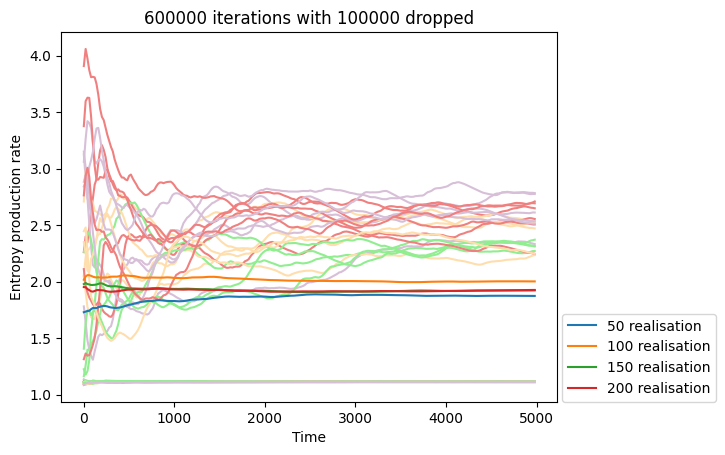

In [ ]:
min = 0e5 * par.dt
max = 5e5*par.dt
x_axis = np.arange(min, max, 20)

for i in range(10):
  # plt.plot(x_axis, S_array_1[i,:], color='lightblue')
  plt.plot(x_axis, S_array_3[i,:], color='navajowhite')
  plt.plot(x_axis, S_array_2[i,:], color='lightgreen')
  plt.plot(x_axis, S_array_4[i,:], color='lightcoral')
  plt.plot(x_axis, S_array_5[i,:], color='thistle')

# plt.plot(x_axis, S1, label='10 realisation')
plt.plot(x_axis, S2, label='50 realisation')
plt.plot(x_axis, S3, label='100 realisation')
plt.plot(x_axis, S4, label='150 realisation')
plt.plot(x_axis, S5, label='200 realisation')

plt.title(f'{par.Nt} iterations with 100000 dropped')
plt.xlabel('Time')
plt.ylabel('Entropy production rate')
plt.legend(loc=(1.01,0))

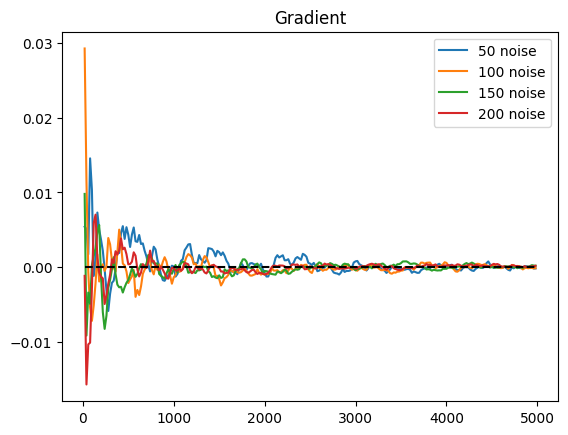

In [ ]:
# test gradient
# rate1 = S1[1:] - S1[:-1]
# rate5 = S5[1:] - S5[:-1]
rate2 = S2[1:] - S2[:-1]
rate3 = S3[1:] - S3[:-1]
rate4 = S4[1:] - S4[:-1]
rate5 = S5[1:] - S5[:-1]

min = 0e5 * par.dt + 20
max = 5e5*par.dt
x_axis = np.arange(min, max, 20)
# plt.plot(x_axis, rate1, label='10 noise')
# plt.plot(x_axis, rate5, label='10 noise')
plt.plot(x_axis, rate2, label='50 noise')
plt.plot(x_axis, rate3, label='100 noise')
plt.plot(x_axis, rate4, label='150 noise')
plt.plot(x_axis, rate5, label='200 noise')
plt.plot(x_axis, np.zeros(len(x_axis)), color='black', linestyle = '--')
plt.title('Gradient')
plt.legend()

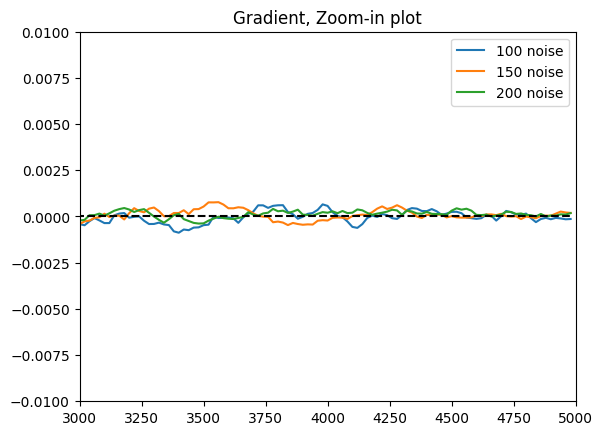

In [ ]:
min = 0e5 * par.dt + 20
max = 5e5*par.dt
x_axis = np.arange(min, max, 20)
# plt.plot(x_axis, rate1, label='10 noise')
# plt.plot(x_axis, rate5, label='10 noise')
# plt.plot(x_axis, rate2, label='50 noise')
plt.plot(x_axis, rate3, label='100 noise')
plt.plot(x_axis, rate4, label='150 noise')
plt.plot(x_axis, rate5, label='200 noise')
plt.plot(x_axis, np.zeros(len(x_axis)), color='black', linestyle = '--')

plt.xlim(3000,5000)
plt.ylim((-0.01, 0.01))
plt.title('Gradient, Zoom-in plot')
plt.legend()

In [ ]:
# Code for saving data if needed
# np.savetxt('6e5_iteration_10_noise.csv', S1, delimiter=',', fmt='%d')
# np.savetxt('6e5_iteration_50_noise.csv', S2, delimiter=',', fmt='%d')
# np.savetxt('6e5_iteration_100_noise.csv', S3, delimiter=',', fmt='%d')

#### Run simulations **DROP 3e+5**

In [ ]:
S1, S_array_1 = simulation(Nt=600000, N_noise=10, C=-0.6, drop=int(3e5))    # 4min 6s

In [ ]:
S2, S_array_2 = simulation(Nt=600000, N_noise=50, C=-0.6, drop=int(3e5))     # 20 min

In [ ]:
S3, S_array_3 = simulation(Nt=600000, N_noise=100, C=-0.6, drop=int(3e5))    # 42min

In [ ]:
S4, S_array_4 = simulation(Nt=600000, N_noise=150, C=-0.6, drop=int(3e5))

In [ ]:
S5, S_array_5 = simulation(Nt=600000, N_noise=200, C=-0.6, drop=int(3e5))

#### Convergence and Comparing

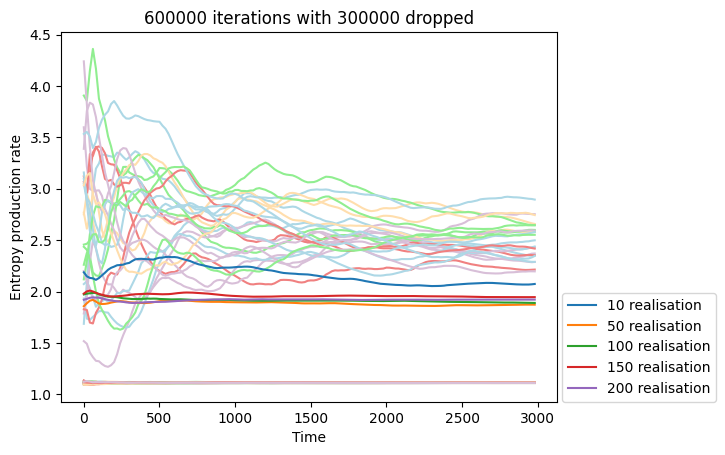

In [ ]:
min = 0e5 * par.dt
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)

for i in range(10):
  plt.plot(x_axis, S_array_1[i,:], color='lightblue')
  plt.plot(x_axis, S_array_3[i,:], color='navajowhite')
  plt.plot(x_axis, S_array_2[i,:], color='lightgreen')
  plt.plot(x_axis, S_array_4[i,:], color='lightcoral')
  plt.plot(x_axis, S_array_5[i,:], color='thistle')

plt.plot(x_axis, S1, label='10 realisation')
plt.plot(x_axis, S2, label='50 realisation')
plt.plot(x_axis, S3, label='100 realisation')
plt.plot(x_axis, S4, label='150 realisation')
plt.plot(x_axis, S5, label='200 realisation')

plt.title(f'{par.Nt} iterations with 300000 dropped')
plt.xlabel('Time')
plt.ylabel('Entropy production rate')
plt.legend(loc=(1.01,0))

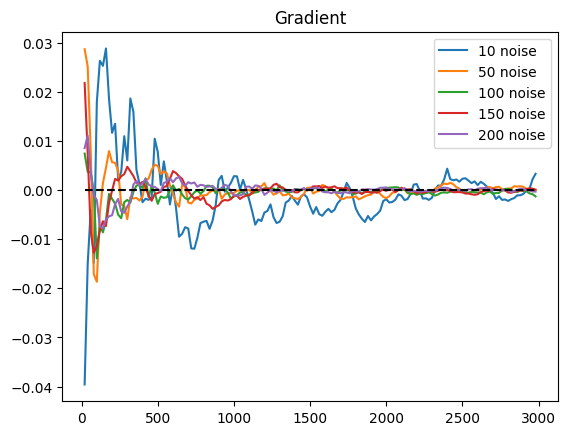

In [ ]:
# test gradient
rate1 = S1[1:] - S1[:-1]
# rate5 = S5[1:] - S5[:-1]
rate2 = S2[1:] - S2[:-1]
rate3 = S3[1:] - S3[:-1]
rate4 = S4[1:] - S4[:-1]
rate5 = S5[1:] - S5[:-1]

min = 0e5 * par.dt + 20
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)
plt.plot(x_axis, rate1, label='10 noise')
# plt.plot(x_axis, rate5, label='10 noise')
plt.plot(x_axis, rate2, label='50 noise')
plt.plot(x_axis, rate3, label='100 noise')
plt.plot(x_axis, rate4, label='150 noise')
plt.plot(x_axis, rate5, label='200 noise')
plt.plot(x_axis, np.zeros(len(x_axis)), color='black', linestyle = '--')
plt.title('Gradient')
plt.legend()

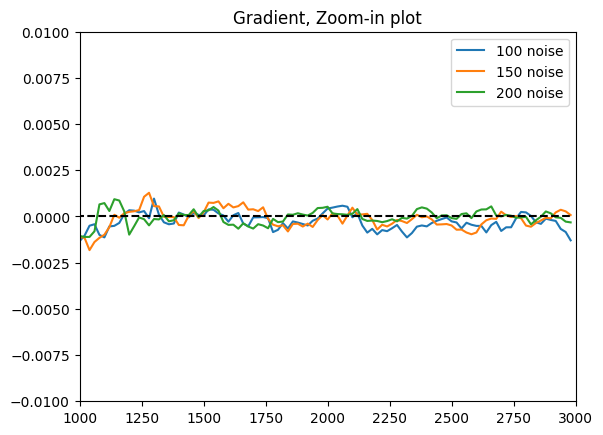

In [ ]:
min = 0e5 * par.dt + 20
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)
# plt.plot(x_axis, rate1, label='10 noise')
# plt.plot(x_axis, rate5, label='10 noise')
# plt.plot(x_axis, rate2, label='50 noise')
plt.plot(x_axis, rate3, label='100 noise')
plt.plot(x_axis, rate4, label='150 noise')
plt.plot(x_axis, rate5, label='200 noise')
plt.plot(x_axis, np.zeros(len(x_axis)), color='black', linestyle = '--')

plt.xlim(1000,3000)
plt.ylim((-0.01, 0.01))
plt.title('Gradient, Zoom-in plot')
plt.legend()

In [ ]:
# np.savetxt('6e5_iteration_10_noise.csv', S1, delimiter=',', fmt='%d')
# np.savetxt('6e5_iteration_50_noise.csv', S2, delimiter=',', fmt='%d')
# np.savetxt('6e5_iteration_100_noise.csv', S3, delimiter=',', fmt='%d')

**At last, we choose to run $3e^5$ iterations and drop the first $2e^5$ iterations. This ensures good convergence and gets rid of effects from the initial conditions.**

## Wavelength Analysis



#### find maximum k

In [ ]:
def lambda_k2(k):
  # eigenvalue = 0.01 * (-54*k**2 + 4.79583*np.sqrt(92*k**4 + 500*k**2 - 625) - 25)        # by wolfram alpha
  eigenvalue = 0.01 * (-54*k**2 + np.sqrt(23)*np.sqrt(92*k**4 + 500*k**2 - 625) - 25)
  return np.real(eigenvalue)

In [ ]:
k_val = np.arange(1.9, 2.3, 0.000000001)
lam = lambda_k2(k_val)

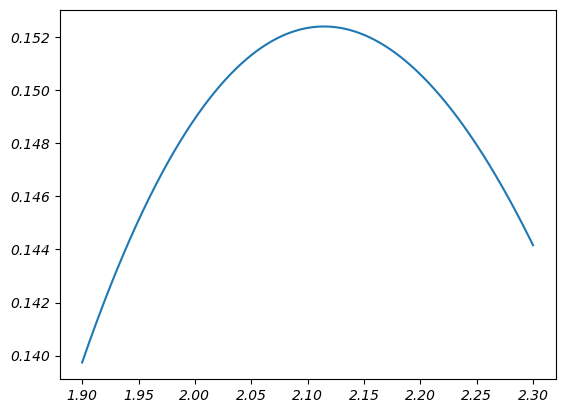

In [ ]:
plt.plot(k_val, lam)

In [ ]:
print(f'The maximizer k to 8 significant figure is {k_val[np.argmax(lam)]}')

The maximizer k to 8 significant figure is 2.1145516147520786


In [ ]:
print(f'The maximizer k to 8 significant figure is {k_val[np.argmax(lam)]}')

The maximizer k to 8 significant figure is 2.11455018175196


select $k_{max} = 2.11455$, use
$$ k_{max} = \frac{2N\pi}{L} ⇒ L = \frac{2N\pi}{k_{max}}$$
where $N$ is the number of waves we want, $L$ is the length.

Generate several pairs of $(N, L)$ to run simulations and compare.

$N = 3, 4, 5, 6, 7, 8$

In [ ]:
k = 2.11455
N = np.arange(3, 9, 1)
print(N)
L = 2*np.pi*N / k
print(L)

[3 4 5 6 7 8]
[ 8.91421623 11.88562164 14.85702704 17.82843245 20.79983786 23.77124327]


### simulations

We seek the most stable and efficient box length.

In [ ]:
class params:
    pass

par = params()
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
# expect 3 stripes
par.L = 9.0
par.N = 46

S_0, S_array_0 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# expect 4 stripes
par.L = 11.8
par.N = 60

S_4, S_array_4 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# expect 5 stripes
par.L = 14.8
par.N = 75

S_5, S_array_5 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# 6 stripes
par.L = 17.8
par.N = 91

S_6, S_array_6 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# 7 stripes
par.L = 20.8
par.N = 105

S_7, S_array_7 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

# 8 stripes
par.L = 23.8
par.N = 120

S_8, S_array_8 = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

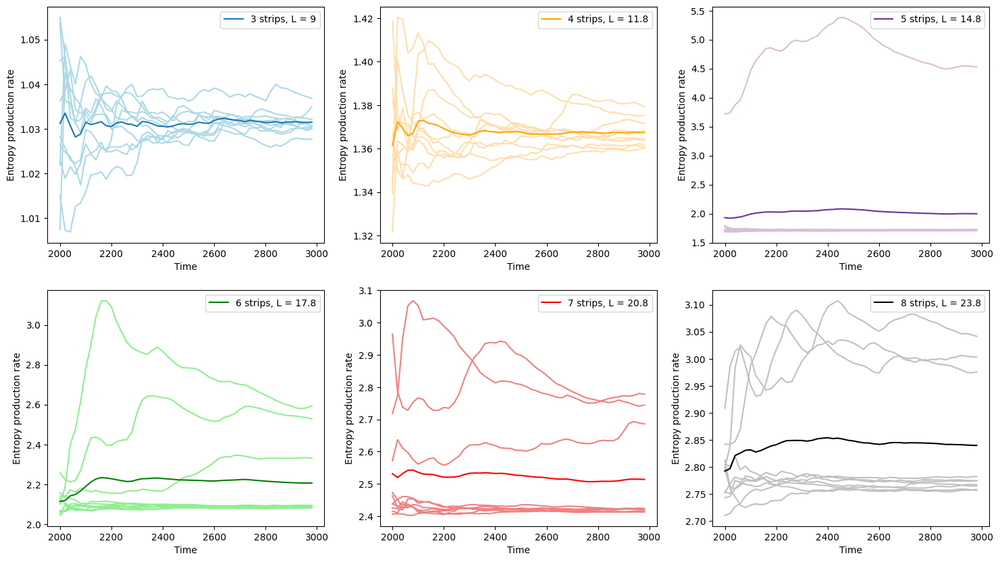

In [ ]:
min = 2e5 * par.dt
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for i in range(10):
  ax[0,0].plot(x_axis, S_array_0[i,:], color='lightblue')
  ax[0,1].plot(x_axis, S_array_4[i,:], color='navajowhite')
  ax[0,2].plot(x_axis, S_array_5[i,:], color='thistle')
  ax[1,0].plot(x_axis, S_array_6[i,:], color='lightgreen')
  ax[1,1].plot(x_axis, S_array_7[i,:], color='lightcoral')
  ax[1,2].plot(x_axis, S_array_8[i,:], color='silver')

ax[0,0].plot(x_axis, S_0, label=f'3 strips, L = 9')
ax[0,1].plot(x_axis, S_4, color='orange',label=f'4 strips, L = 11.8')
ax[0,2].plot(x_axis, S_5, color='rebeccapurple',label=f'5 strips, L = 14.8')
ax[1,0].plot(x_axis, S_6, color='green', label=f'6 strips, L = 17.8')
ax[1,1].plot(x_axis, S_7, color='red', label=f'7 strips, L = 20.8')
ax[1,2].plot(x_axis, S_8, color='black', label=f'8 strips, L = 23.8')

for j in range(3):
  ax[0,j].set_xlabel('Time')
  ax[0,j].set_ylabel('Entropy production rate')
  ax[0,j].legend()
  ax[1,j].set_xlabel('Time')
  ax[1,j].set_ylabel('Entropy production rate')
  ax[1,j].legend()

### One more space step?
compare if we round down or add one more space step for $N=4,5,6$

In [ ]:
# expect 4 stripes
par.L = 12
par.N = 61

S_4_onemore, S_array_4_onemore = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# expect 5 stripes
par.L = 15
par.N = 76

S_5_onemore, S_array_5_onemore = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# 6 stripes
par.L = 18
par.N = 91

S_6_onemore, S_array_6_onemore = simulation(Nt=300000, N_noise=10, C=-0.6, para=par, drop=int(2e5))

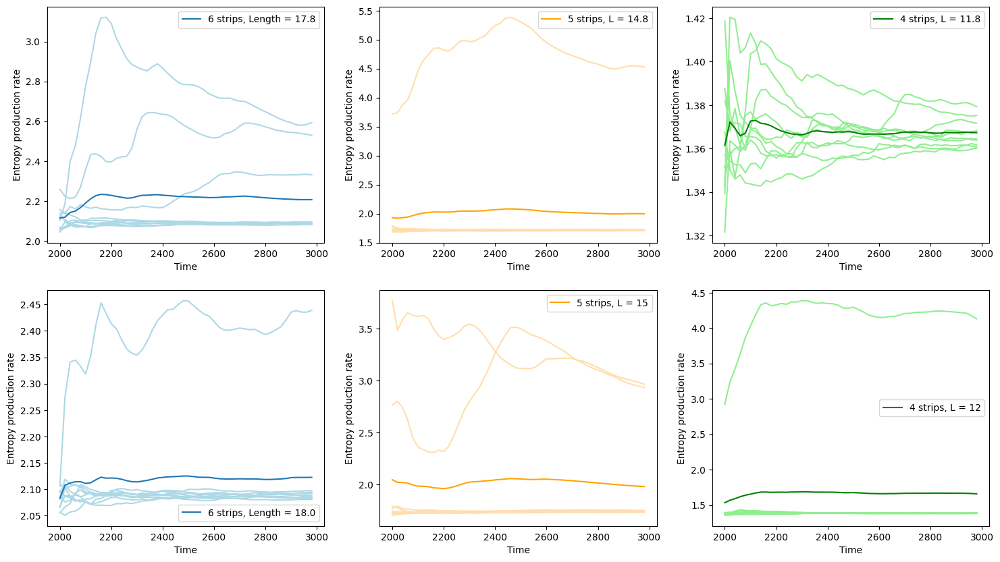

In [ ]:
min = 2e5 * par.dt
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for i in range(10):
  ax[0,0].plot(x_axis, S_array_6[i,:], color='lightblue')
  ax[0,1].plot(x_axis, S_array_5[i,:], color='navajowhite')
  ax[0,2].plot(x_axis, S_array_4[i,:], color='lightgreen')
  ax[1,0].plot(x_axis, S_array_6_onemore[i,:], color='lightblue')
  ax[1,1].plot(x_axis, S_array_5_onemore[i,:], color='navajowhite')
  ax[1,2].plot(x_axis, S_array_4_onemore[i,:], color='lightgreen')


ax[0,0].plot(x_axis, S_6, label=f'6 strips, Length = 17.8')
ax[1,0].plot(x_axis, S_6_onemore, label=f'6 strips, Length = 18.0')

ax[0,1].plot(x_axis, S_5, color='orange',label=f'5 strips, L = 14.8')
ax[1,1].plot(x_axis, S_5_onemore, color='orange', label=f'5 strips, L = 15')

ax[0,2].plot(x_axis, S_4, color='green',label=f'4 strips, L = 11.8')
ax[1,2].plot(x_axis, S_4_onemore, color='green', label=f'4 strips, L = 12')


for j in range(3):
  ax[0,j].set_xlabel('Time')
  ax[0,j].set_ylabel('Entropy production rate')
  ax[0,j].legend()
  ax[1,j].set_xlabel('Time')
  ax[1,j].set_ylabel('Entropy production rate')
  ax[1,j].legend()

### Compare for 3 strips and 4 strips

In [ ]:
class params:
    pass

par = params()
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
# expect 3 stripes
# running time 132s for 10 realizations
par.L = 9.0
par.N = 46

S3, S_array_3 = simulation(Nt=300000, N_noise=200, C=-0.6, para=par, drop=int(2e5))

In [ ]:
# 4 stripes
# running time 135s for 10 realizations
par.L = 11.8
par.N = 60

S4, S_array_4 = simulation(Nt=300000, N_noise=200, C=-0.6, para=par, drop=int(2e5))

Text(0.5, 0.98, '200 Realizations')

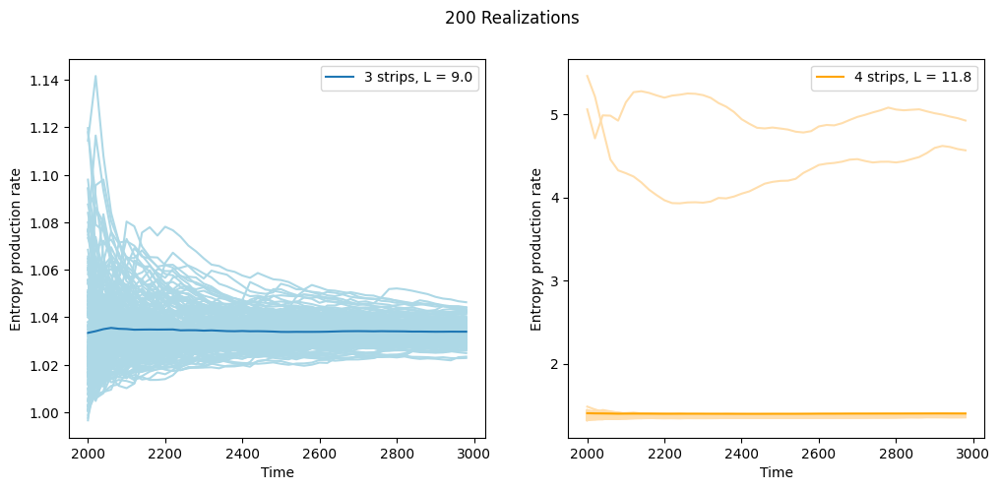

In [ ]:
min = 2e5 * par.dt
max = 3e5*par.dt
x_axis = np.arange(min, max, 20)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i in range(200):
  ax[0].plot(x_axis, S_array_3[i,:], color='lightblue')
  ax[1].plot(x_axis, S_array_4[i,:], color='navajowhite')

ax[0].plot(x_axis, S3, label=f'3 strips, L = 9.0')
ax[1].plot(x_axis, S4, color='orange',label=f'4 strips, L = 11.8')

for j in range(2):
  ax[j].set_xlabel('Time')
  ax[j].set_ylabel('Entropy production rate')
  ax[j].legend()

fig.suptitle("200 Realizations")

# Entropy Production Change with C

we choose 3000 seconds and drop first 2000 seconds \
And parameters:

In [ ]:
# class params:
#     pass

# par = params()
# par.L = 9.0
# par.N = 46
# par.dt = 0.01
# par.dx = 0.2
# par.H = 3
# par.D = 0.08

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load all data and Process the data

for the whole set of C


In [ ]:
# load data
file_path1 = '/content/drive/My Drive/M4R/EPR_dict1.pickle'
file_path2 = '/content/drive/My Drive/M4R/EPR_dict2.pickle'
file_path3 = '/content/drive/My Drive/M4R/EPR_dict3.pickle'
file_path4 = '/content/drive/My Drive/M4R/EPR_dict4.pickle'
file_path5 = '/content/drive/My Drive/M4R/EPR_dict5.pickle'

with open(file_path1, 'rb') as handle:
    EPR_dict1 = pickle.load(handle)

with open(file_path2, 'rb') as handle:
    EPR_dict2 = pickle.load(handle)

with open(file_path3, 'rb') as handle:
    EPR_dict3 = pickle.load(handle)

with open(file_path4, 'rb') as handle:
    EPR_dict4 = pickle.load(handle)

with open(file_path5, 'rb') as handle:
    EPR_dict5 = pickle.load(handle)

In [ ]:
# process data
S_list = []
S_array_list = []

merged_dict = {**EPR_dict1, **EPR_dict2, **EPR_dict3, **EPR_dict4, **EPR_dict5}
print(list(merged_dict.keys()))
merged_dict_values = list(merged_dict.values())
for i in range(len(merged_dict)):
  S_list.append(merged_dict_values[i][0])
  S_array_list.append(merged_dict_values[i][1])

['C=-0.1', 'C=-0.2', 'C=-0.30000000000000004', 'C=-0.4', 'C=-0.5', 'C=-0.6', 'C=-0.7000000000000001', 'C=-0.8', 'C=-0.9', 'C=-1.0', 'C=-1.1', 'C=-1.2000000000000002', 'C=-1.3', 'C=-1.4', 'C=-1.5', 'C=-1.6', 'C=-1.7', 'C=-1.8', 'C=-1.9', 'C=-2.0', 'C=-2.0999999999999996', 'C=-2.1999999999999997', 'C=-2.3']


for 100 realisations

In [ ]:
file_path = '/content/drive/My Drive/M4R/EPR_100_odd.pickle'

with open(file_path, 'rb') as handle:
    EPR_100 = pickle.load(handle)

In [ ]:
# process data
S_list_100 = []
S_array_list_100 = []

keys = list(EPR_100.keys())
print(keys)
EPR_100_values = list(EPR_100.values())
for i in range(len(EPR_100_values)):
  S_list_100.append(EPR_100_values[i][0])
  S_array_list_100.append(EPR_100_values[i][1])

['C=-0.1', 'C=-0.30000000000000004', 'C=-0.5', 'C=-0.7000000000000001', 'C=-0.9', 'C=-1.1', 'C=-1.3000000000000003', 'C=-1.5000000000000002', 'C=-1.7000000000000002', 'C=-1.9000000000000001', 'C=-2.1']


for values between -0.7 to -0.9

In [ ]:
# load data
file_path1 = '/content/drive/My Drive/M4R/EPR_dict1(0.7-0.9).pickle'
file_path2 = '/content/drive/My Drive/M4R/EPR_dict2(0.7-0.9).pickle'
file_path3 = '/content/drive/My Drive/M4R/EPR_dict3(0.7-0.9).pickle'

with open(file_path1, 'rb') as handle:
    EPR_dict_tran_1 = pickle.load(handle)

with open(file_path2, 'rb') as handle:
    EPR_dict_tran_2 = pickle.load(handle)

with open(file_path3, 'rb') as handle:
    EPR_dict_tran_3 = pickle.load(handle)

In [ ]:
# process data
S_list_79 = []
S_array_list_79 = []

merged_dict = {**EPR_dict_tran_1, **EPR_dict_tran_2, **EPR_dict_tran_3}
print(list(merged_dict.keys()))
merged_dict_values = list(merged_dict.values())
for i in range(len(merged_dict)):
  S_list_79.append(merged_dict_values[i][0])
  S_array_list_79.append(merged_dict_values[i][1])

['C=-0.7', 'C=-0.71', 'C=-0.72', 'C=-0.73', 'C=-0.74', 'C=-0.75', 'C=-0.76', 'C=-0.77', 'C=-0.78', 'C=-0.79', 'C=-0.8', 'C=-0.8099999999999999', 'C=-0.82', 'C=-0.83', 'C=-0.84', 'C=-0.85', 'C=-0.86', 'C=-0.87', 'C=-0.88', 'C=-0.89', 'C=-0.9']


for values from -1.5 to -2.3

In [ ]:
# load data
file_path1 = '/content/drive/My Drive/M4R/EPR(1.5-2.3)_1.pickle'
file_path2 = '/content/drive/My Drive/M4R/EPR(1.5-2.3)_2.pickle'
file_path3 = '/content/drive/My Drive/M4R/EPR(1.5-2.3)_3.pickle'
file_path4 = '/content/drive/My Drive/M4R/EPR(1.5-2.3)_4.pickle'

with open(file_path1, 'rb') as handle:
    EPR_dict_chao_1 = pickle.load(handle)

with open(file_path2, 'rb') as handle:
    EPR_dict_chao_2 = pickle.load(handle)

with open(file_path3, 'rb') as handle:
    EPR_dict_chao_3 = pickle.load(handle)

with open(file_path4, 'rb') as handle:
    EPR_dict_chao_4 = pickle.load(handle)

In [ ]:
# process data
S_list_15_23 = []
S_array_list_15_23 = []

merged_dict = {**EPR_dict_chao_1, **EPR_dict_chao_2, **EPR_dict_chao_3, **EPR_dict_chao_4}
print(list(merged_dict.keys()))
merged_dict_values = list(merged_dict.values())
for i in range(len(merged_dict)):
  S_list_15_23.append(merged_dict_values[i][0])
  S_array_list_15_23.append(merged_dict_values[i][1])

['C=-1.5', 'C=-1.52', 'C=-1.54', 'C=-1.56', 'C=-1.58', 'C=-1.5999999999999999', 'C=-1.6199999999999999', 'C=-1.64', 'C=-1.66', 'C=-1.68', 'C=-1.7', 'C=-1.72', 'C=-1.74', 'C=-1.76', 'C=-1.78', 'C=-1.7999999999999998', 'C=-1.8199999999999998', 'C=-1.8399999999999999', 'C=-1.8599999999999999', 'C=-1.88', 'C=-1.9', 'C=-1.92', 'C=-1.94', 'C=-1.96', 'C=-1.98', 'C=-2.0', 'C=-2.02', 'C=-2.04', 'C=-2.06', 'C=-2.08', 'C=-2.1', 'C=-2.12', 'C=-2.14', 'C=-2.16', 'C=-2.18', 'C=-2.2', 'C=-2.2199999999999998', 'C=-2.2399999999999998', 'C=-2.26', 'C=-2.28', 'C=-2.3']


-1.4 to -2.0

In [ ]:
# load data
file_path1 = '/content/drive/My Drive/M4R/EPR(1.41-1.5).pickle'
file_path2 = '/content/drive/My Drive/M4R/EPR(1.5-2)_2.pickle'
file_path3 = '/content/drive/My Drive/M4R/EPR(1.5-2)_3.pickle'
file_path4 = '/content/drive/My Drive/M4R/EPR(1.5-2)_4.pickle'

with open(file_path1, 'rb') as handle:
    EPR_dict_c1 = pickle.load(handle)

with open(file_path2, 'rb') as handle:
    EPR_dict_c2 = pickle.load(handle)

with open(file_path3, 'rb') as handle:
    EPR_dict_c3 = pickle.load(handle)

with open(file_path4, 'rb') as handle:
    EPR_dict_c4 = pickle.load(handle)

In [ ]:
# process data
S_list_14_23 = []
S_array_list_14_23 = []

# merged_dict_1420 = {**EPR_dict_c1, **EPR_dict_c2, **EPR_dict_c3, **EPR_dict_c4}
# print(list(merged_dict.keys()))
# merged_dict_values = list(merged_dict.values())
# for i in range(len(merged_dict)):
#   S_list_15_23.append(merged_dict_values[i][0])
#   S_array_list_15_23.append(merged_dict_values[i][1])

merged_dict = {**EPR_dict_chao_1, **EPR_dict_chao_2, **EPR_dict_chao_3, **EPR_dict_chao_4, **EPR_dict_c1, **EPR_dict_c2, **EPR_dict_c3, **EPR_dict_c4}
sorted_keys = sorted(merged_dict.keys(), key=lambda x: float(x.split('=')[1]), reverse=True)
sorted_dict = {key: merged_dict[key] for key in sorted_keys}
print(list(sorted_dict.keys()))

sorted_dict_values = list(sorted_dict.values())
for i in range(len(sorted_dict)):
  S_list_14_23.append(sorted_dict_values[i][0])
  S_array_list_14_23.append(sorted_dict_values[i][1])

['C=-1.41', 'C=-1.42', 'C=-1.43', 'C=-1.44', 'C=-1.45', 'C=-1.46', 'C=-1.47', 'C=-1.48', 'C=-1.49', 'C=-1.5', 'C=-1.51', 'C=-1.52', 'C=-1.53', 'C=-1.54', 'C=-1.55', 'C=-1.56', 'C=-1.57', 'C=-1.58', 'C=-1.59', 'C=-1.5999999999999999', 'C=-1.6099999999999999', 'C=-1.6199999999999999', 'C=-1.63', 'C=-1.64', 'C=-1.65', 'C=-1.66', 'C=-1.67', 'C=-1.68', 'C=-1.69', 'C=-1.7', 'C=-1.71', 'C=-1.72', 'C=-1.73', 'C=-1.74', 'C=-1.75', 'C=-1.76', 'C=-1.77', 'C=-1.78', 'C=-1.79', 'C=-1.7999999999999998', 'C=-1.8099999999999998', 'C=-1.8199999999999998', 'C=-1.8299999999999998', 'C=-1.8399999999999999', 'C=-1.8499999999999999', 'C=-1.8599999999999999', 'C=-1.8699999999999999', 'C=-1.88', 'C=-1.89', 'C=-1.9', 'C=-1.91', 'C=-1.92', 'C=-1.93', 'C=-1.94', 'C=-1.95', 'C=-1.96', 'C=-1.97', 'C=-1.98', 'C=-1.99', 'C=-2.0', 'C=-2.02', 'C=-2.04', 'C=-2.06', 'C=-2.08', 'C=-2.1', 'C=-2.12', 'C=-2.14', 'C=-2.16', 'C=-2.18', 'C=-2.2', 'C=-2.2199999999999998', 'C=-2.2399999999999998', 'C=-2.26', 'C=-2.28', 'C=-2.3']

## Comparing 200 realisations with 100 realisations

**100 realisations**

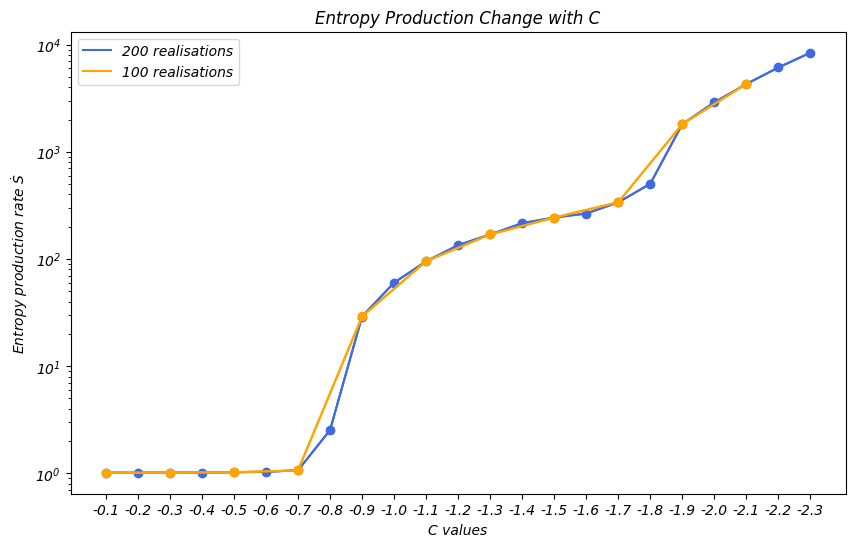

In [ ]:
C_val = np.linspace(-0.1,-2.3,23)
C_val100 = np.linspace(-0.1,-2.1,11)

plt.figure(figsize=(10,6))
plt.plot(C_val, np.array(S_list)[:,-1], color='royalblue', label='200 realisations')
plt.plot(C_val, np.array(S_list)[:,-1], color='royalblue', marker='o')
plt.plot(C_val100, np.array(S_list_100)[:,-1], color='orange', label='100 realisations')
plt.plot(C_val100, np.array(S_list_100)[:,-1], color='orange', marker='o')

xlabels = [f"{val:.1f}" for val in C_val]
plt.xticks(C_val, labels = xlabels)
plt.yscale("log")
plt.xlabel('C values')
plt.ylabel(r'Entropy production rate $\dot{S}$')
plt.gca().invert_xaxis()
plt.title('Entropy Production Change with C')
plt.legend()

Text(0.5, 1.0, 'Difference between 100 realisations and 200 realisations')

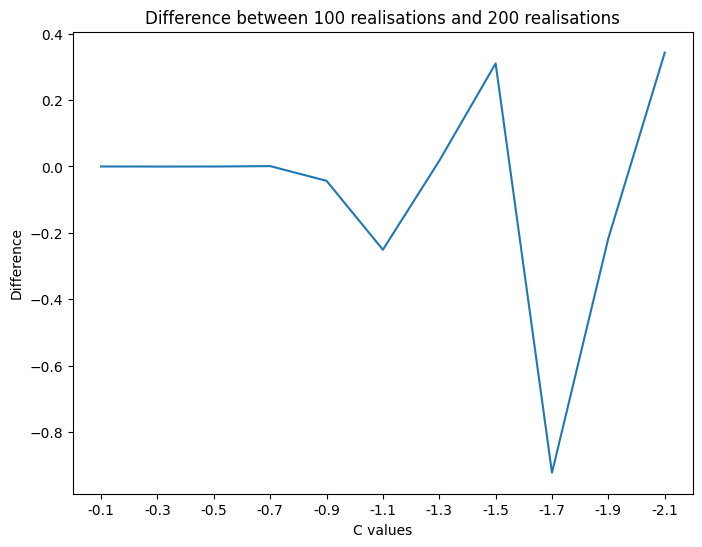

In [ ]:
# Difference between values
S_200 = np.array(S_list)[:,-1][:-1:2]
diff = S_200 - np.array(S_list_100)[:,-1]

plt.figure(figsize=(8, 6))
plt.plot(C_val100, diff)
xlabels = [f"{val:.1f}" for val in C_val100]
plt.xticks(C_val100, labels = xlabels)
plt.xlabel('C values')
plt.ylabel(r'Difference')
plt.gca().invert_xaxis()
plt.title('Difference between 100 realisations and 200 realisations')

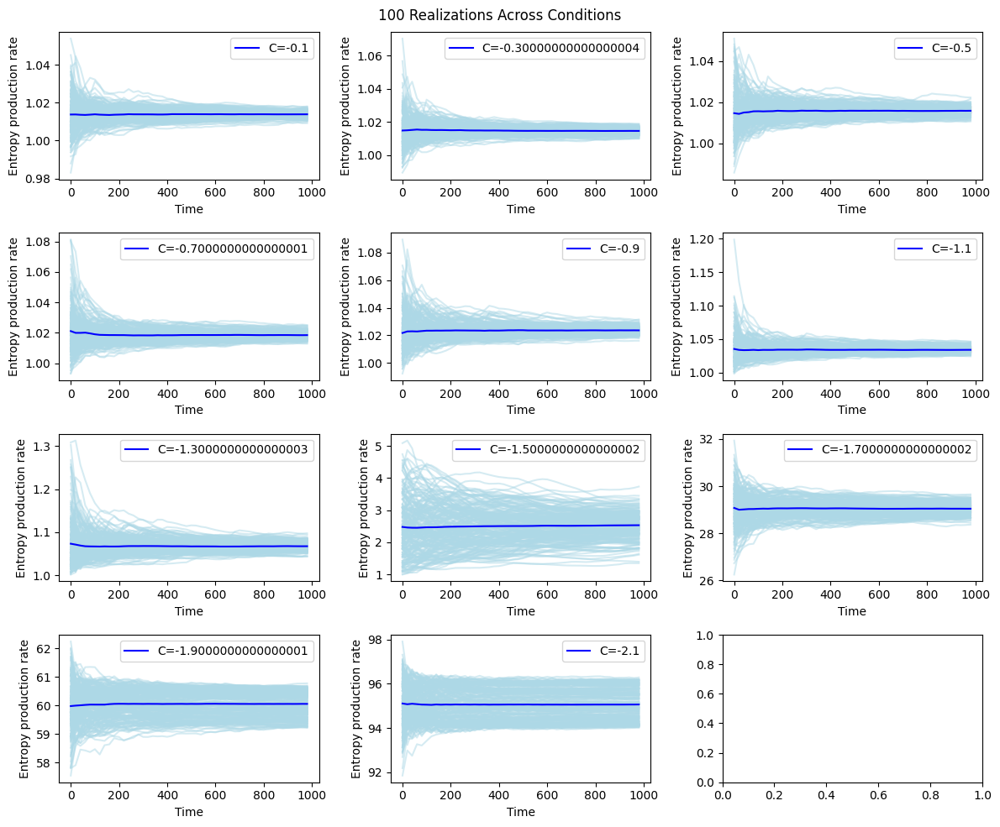

In [ ]:
x_axis = np.arange(0, 1000, 20)

fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(12, 10))

for i in range(4):
    for j in range(3):
        index = (i*3 + j)
        if index>10:
          pass
        else:
          for realization in S_array_list[index]:
              ax[i, j].plot(x_axis, realization, color='lightblue', alpha=0.5)

          ax[i, j].plot(x_axis, S_list[index], color='b', label=keys[index])
          ax[i, j].set_xlabel('Time')
          ax[i, j].set_ylabel('Entropy production rate')
          ax[i, j].legend()

fig.suptitle("100 Realizations Across Conditions")
plt.tight_layout()
plt.show()

**200 realisations**

In [ ]:
C_val = np.linspace(-0.1,-2.3,23)

Text(0.5, 1.0, 'Entropy Production Change with C')

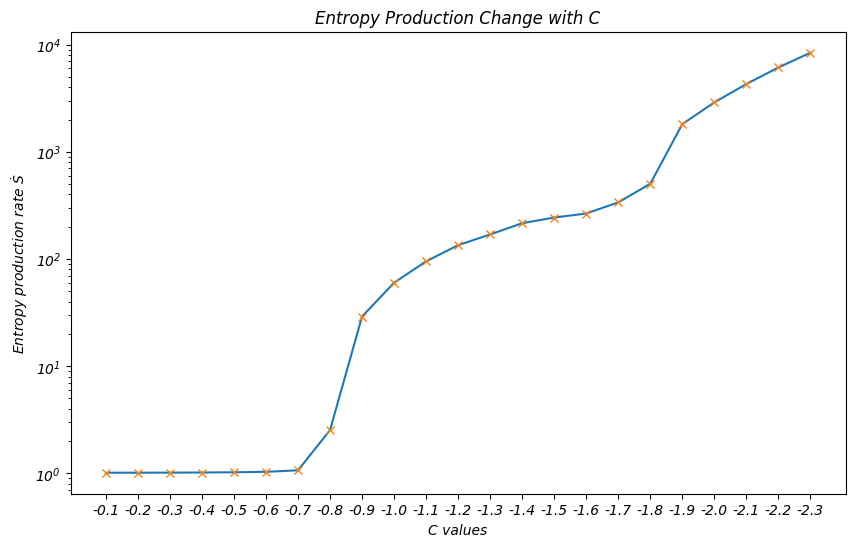

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(C_val, np.array(S_list)[:,-1])
plt.plot(C_val, np.array(S_list)[:,-1], 'x')

xlabels = [f"{val:.1f}" for val in C_val]
plt.xticks(C_val, labels = xlabels)
plt.yscale("log")
plt.xlabel('C values')
plt.ylabel(r'Entropy production rate $\dot{S}$')
plt.gca().invert_xaxis()
plt.title('Entropy Production Change with C')

Text(0.5, 0.98, '200 Realizations')

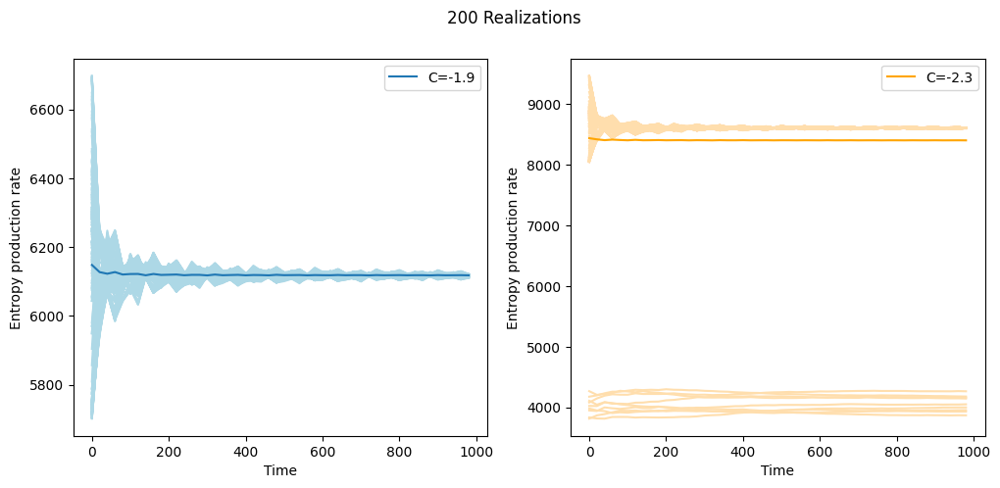

In [ ]:
x_axis = np.arange(0, 1000, 20)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i in range(200):
  ax[0].plot(x_axis, S_array_list[-2][i,:], color='lightblue')
  ax[1].plot(x_axis, S_array_list[-1][i,:], color='navajowhite')

ax[0].plot(x_axis, S_list[-2], label=f'C=-2.2')
ax[1].plot(x_axis, S_list[-1], color='orange',label=f'C=-2.3')

for j in range(2):
  ax[j].set_xlabel('Time')
  ax[j].set_ylabel('Entropy production rate')
  ax[j].legend()

fig.suptitle("200 Realizations")

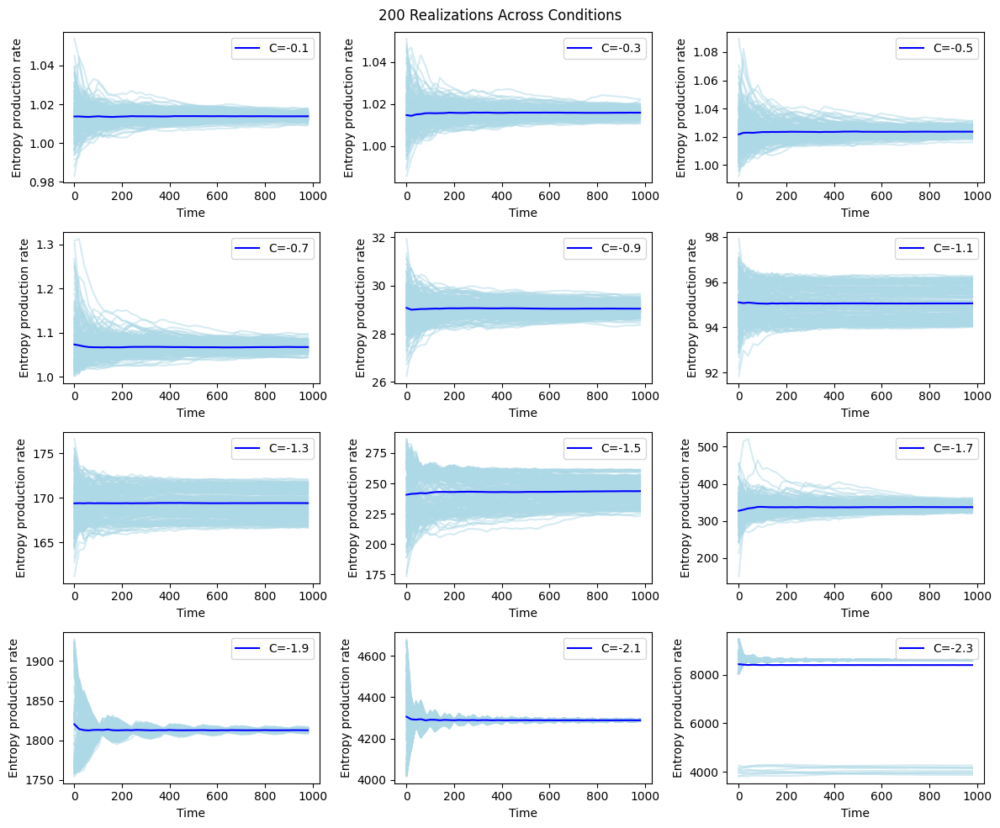

In [ ]:
x_axis = np.arange(0, 1000, 20)

fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(12, 10))

for i in range(4):
    for j in range(3):
        index = (i*3 + j)*2
        for realization in S_array_list[index]:
            ax[i, j].plot(x_axis, realization, color='lightblue', alpha=0.5)

        ax[i, j].plot(x_axis, S_list[index], color='b', label=f'C={C_val[index]:.1f}')
        ax[i, j].set_xlabel('Time')
        ax[i, j].set_ylabel('Entropy production rate')
        ax[i, j].legend()

fig.suptitle("200 Realizations Across Conditions")
plt.tight_layout()
plt.show()

## Finer interval

-0.1 to -0.7 with -0.1 interval width \
-0.7 to -0.9 with -0.01 interval width \
-0.9 to -1.5 with -0.1 interval width \
-1.4 to -2.0 with -0.01 interval width \
-2.0 to -2.3 with -0.02 interval width

#### finer in -1.4 to -2.0

In [ ]:
C_val = np.concatenate((np.linspace(-0.1,-0.6,6), np.linspace(-0.7,-0.9,21), np.linspace(-1.0,-1.3,4), np.linspace(-1.4,-1.99,60), np.linspace(-2.0,-2.3,16)))
print(C_val)
print(C_val.shape)

# numpy array
EPR = np.array(S_list)
s7 = np.array((S_list[6][-1] + S_list_79[0][-1]) / 2)
s9 = np.array((S_list[8][-1] + S_list_79[-1][-1]) / 2)

S_plot = np.concatenate((np.append(EPR[:6,-1], s7), np.append(np.array(S_list_79)[1:-1,-1], s9), EPR[9:14,-1], np.array(S_list_14_23)[:,-1]))
np.shape(S_plot)

[-0.1  -0.2  -0.3  -0.4  -0.5  -0.6  -0.7  -0.71 -0.72 -0.73 -0.74 -0.75
 -0.76 -0.77 -0.78 -0.79 -0.8  -0.81 -0.82 -0.83 -0.84 -0.85 -0.86 -0.87
 -0.88 -0.89 -0.9  -1.   -1.1  -1.2  -1.3  -1.4  -1.41 -1.42 -1.43 -1.44
 -1.45 -1.46 -1.47 -1.48 -1.49 -1.5  -1.51 -1.52 -1.53 -1.54 -1.55 -1.56
 -1.57 -1.58 -1.59 -1.6  -1.61 -1.62 -1.63 -1.64 -1.65 -1.66 -1.67 -1.68
 -1.69 -1.7  -1.71 -1.72 -1.73 -1.74 -1.75 -1.76 -1.77 -1.78 -1.79 -1.8
 -1.81 -1.82 -1.83 -1.84 -1.85 -1.86 -1.87 -1.88 -1.89 -1.9  -1.91 -1.92
 -1.93 -1.94 -1.95 -1.96 -1.97 -1.98 -1.99 -2.   -2.02 -2.04 -2.06 -2.08
 -2.1  -2.12 -2.14 -2.16 -2.18 -2.2  -2.22 -2.24 -2.26 -2.28 -2.3 ]
(107,)


(107,)

## Plots

### Entropy production rate varying with C

In [ ]:
c0 = -0.1
c1 = -0.8
c2 = -1.5
c3 = -1.85
critical_c = [c0, c1, c2, c3]

ind0 = np.where(C_val==c0)[0][0]
ind1 = np.where(C_val==c1)[0][0]
ind2 = np.where(C_val==c2)[0][0]
ind3 = np.where(C_val==c3)[0][0]
index_list = [ind0, ind1, ind2, ind3]

# slice into different pieces
range1 = C_val[:ind1]
range2 = C_val[ind1+1:ind2]
range3 = C_val[ind2+1:ind3]
range4 = C_val[ind3+1:]

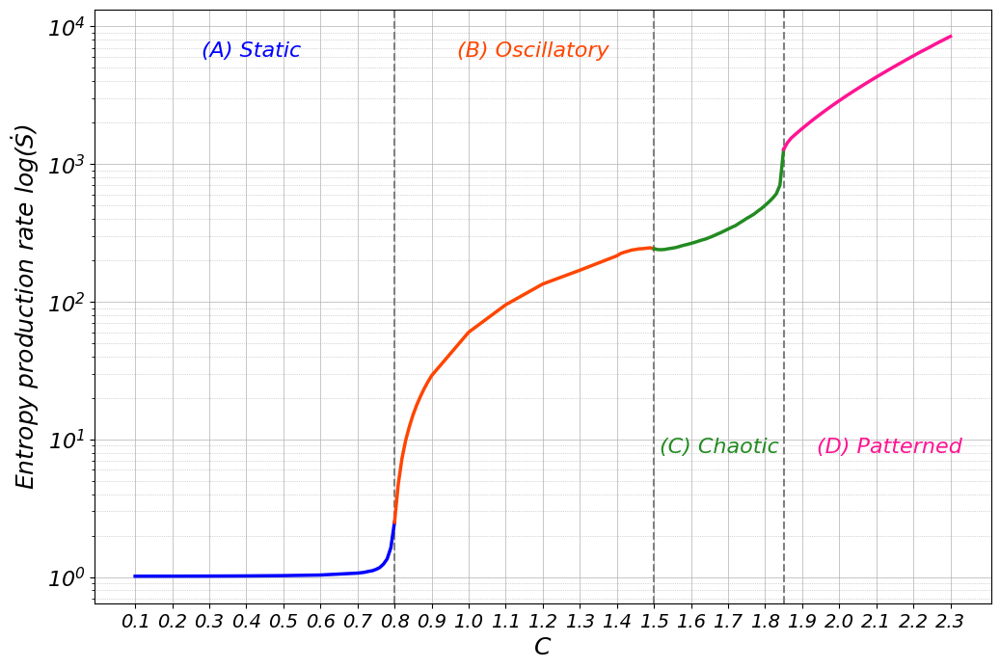

In [ ]:
plt.figure(figsize=(12,8))

# splitting
for position in critical_c[1:]:
    plt.axvline(x=position, color='gray', linestyle='--', linewidth=1.5)

# plotting
plt.plot(C_val[:ind1+1], S_plot[:ind1+1], linewidth=2.5, color='b')
plt.plot(C_val[ind1:ind2+1], S_plot[ind1:ind2+1], linewidth=2.5, color='orangered')
plt.plot(C_val[ind2:ind3+1], S_plot[ind2:ind3+1], linewidth=2.5, color='forestgreen')
plt.plot(C_val[ind3:], S_plot[ind3:], linewidth=2.5, color='deeppink')

# text
plt.text(-0.28, 6000, '(A) Static', fontsize=16, color='b')
plt.text(-0.97, 6000, '(B) Oscillatory', fontsize=16, color='orangered')
plt.text(-1.515, 8, '(C) Chaotic', fontsize=16, color='forestgreen')
plt.text(-1.94, 8, '(D) Patterned', fontsize=16, color='deeppink')

# axis
C_val_label = np.linspace(-0.1,-2.3,23)
xlabels = [f"{-val:.1f}" for val in C_val_label]
plt.xticks(C_val_label, labels = xlabels, fontsize=14)
plt.yscale("log")

# grids
plt.minorticks_on()
plt.grid(which='both', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5')

# label
plt.xlabel('C', fontsize=18)
plt.ylabel(r'Entropy production rate $log(\dot{S})$', fontsize=18)
plt.gca().invert_xaxis()
# plt.title(r'$log(\dot{S}(C))$, Log-linear Plot')
plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/ticker.py:2937: RuntimeWarning: invalid value encountered in log10
  majorstep_no_exponent = 10 ** (np.log10(majorstep) % 1)


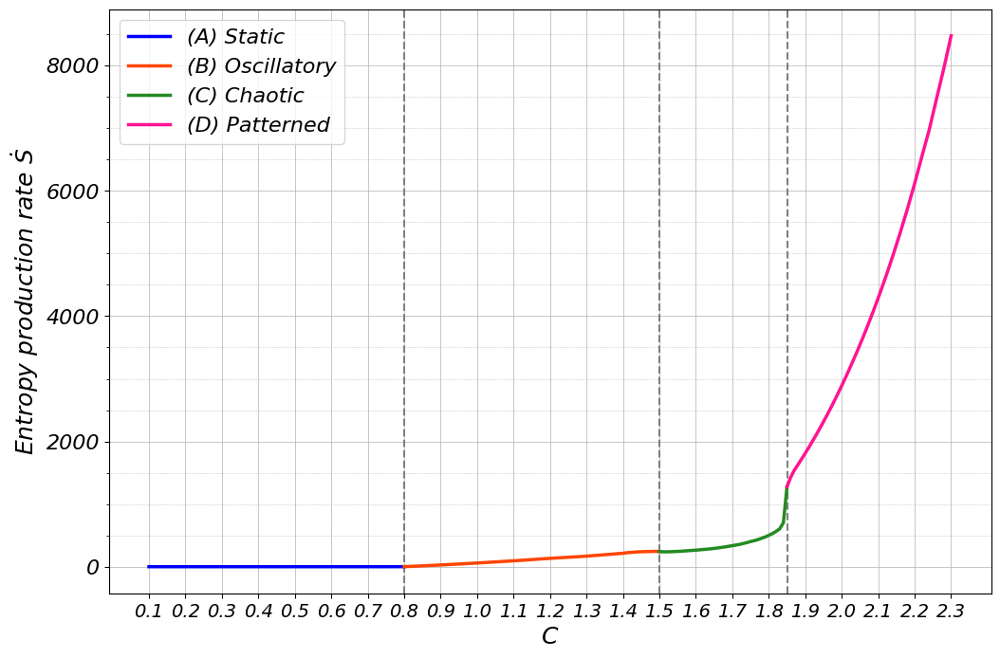

In [ ]:
plt.figure(figsize=(12,8))

# splitting
for position in critical_c[1:]:
    plt.axvline(x=position, color='gray', linestyle='--', linewidth=1.5)

# plotting
plt.plot(C_val[:ind1+1], S_plot[:ind1+1], linewidth=2.5, color='b', label='(A) Static')
plt.plot(C_val[ind1:ind2+1], S_plot[ind1:ind2+1], linewidth=2.5, color='orangered', label='(B) Oscillatory')
plt.plot(C_val[ind2:ind3+1], S_plot[ind2:ind3+1], linewidth=2.5, color='forestgreen', label='(C) Chaotic')
plt.plot(C_val[ind3:], S_plot[ind3:], linewidth=2.5, color='deeppink', label='(D) Patterned')

# text
# plt.text(-0.28, 6000, '(A) Static', fontsize=11, color='b')
# plt.text(-0.98, 6000, '(B) Oscillatory', fontsize=11, color='orangered')
# plt.text(-1.54, 8, '(C) Chaotic', fontsize=11, color='forestgreen')
# plt.text(-1.95, 8, '(D) Patterned', fontsize=11, color='deeppink')

# axis
C_val_label = np.linspace(-0.1,-2.3,23)
xlabels = [f"{-val:.1f}" for val in C_val_label]
plt.xticks(C_val_label, labels = xlabels, fontsize=14)
# plt.yscale("log")

# grids
plt.minorticks_on()
plt.grid(which='both', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5')

# label
plt.xlabel('C', fontsize=18)
plt.ylabel(r'Entropy production rate $\dot{S}$', fontsize=18)
plt.gca().invert_xaxis()
# plt.title(r'$\dot{S}(C)$, Linear-linear Plot')
plt.legend()
plt.show()

### Log-log Plots

To test if there exists entropy production rate gap, and if there exists a power law.

We select the transition values:

$$c_0 = -0.1, \ c_1 = -0.8$$
$$c_2 = -1.5, \ c_3 = -1.9$$

(C_val and S_plot contains all values)

In [ ]:
print(C_val)

[-0.1  -0.2  -0.3  -0.4  -0.5  -0.6  -0.7  -0.71 -0.72 -0.73 -0.74 -0.75
 -0.76 -0.77 -0.78 -0.79 -0.8  -0.81 -0.82 -0.83 -0.84 -0.85 -0.86 -0.87
 -0.88 -0.89 -0.9  -1.   -1.1  -1.2  -1.3  -1.4  -1.41 -1.42 -1.43 -1.44
 -1.45 -1.46 -1.47 -1.48 -1.49 -1.5  -1.51 -1.52 -1.53 -1.54 -1.55 -1.56
 -1.57 -1.58 -1.59 -1.6  -1.61 -1.62 -1.63 -1.64 -1.65 -1.66 -1.67 -1.68
 -1.69 -1.7  -1.71 -1.72 -1.73 -1.74 -1.75 -1.76 -1.77 -1.78 -1.79 -1.8
 -1.81 -1.82 -1.83 -1.84 -1.85 -1.86 -1.87 -1.88 -1.89 -1.9  -1.91 -1.92
 -1.93 -1.94 -1.95 -1.96 -1.97 -1.98 -1.99 -2.   -2.02 -2.04 -2.06 -2.08
 -2.1  -2.12 -2.14 -2.16 -2.18 -2.2  -2.22 -2.24 -2.26 -2.28 -2.3 ]


In [ ]:
c0 = -0.1
c1 = -0.8
c2 = -1.5
c3 = -1.85
critical_c = [c0, c1, c2, c3]

ind0 = np.where(C_val==c0)[0][0]
ind1 = np.where(C_val==c1)[0][0]
# ind2 = np.where(C_val==c2)[0][0]
ind2 = np.where(np.isclose(C_val, c2, atol=1e-8))[0][0]
ind3 = np.where(C_val==c3)[0][0]
index_list = [ind0, ind1, ind2, ind3]

# slice into different pieces
range1 = C_val[:ind1]
range2 = C_val[ind1+1:ind2]
range3 = C_val[ind2+1:ind3]
range4 = C_val[ind3+1:]

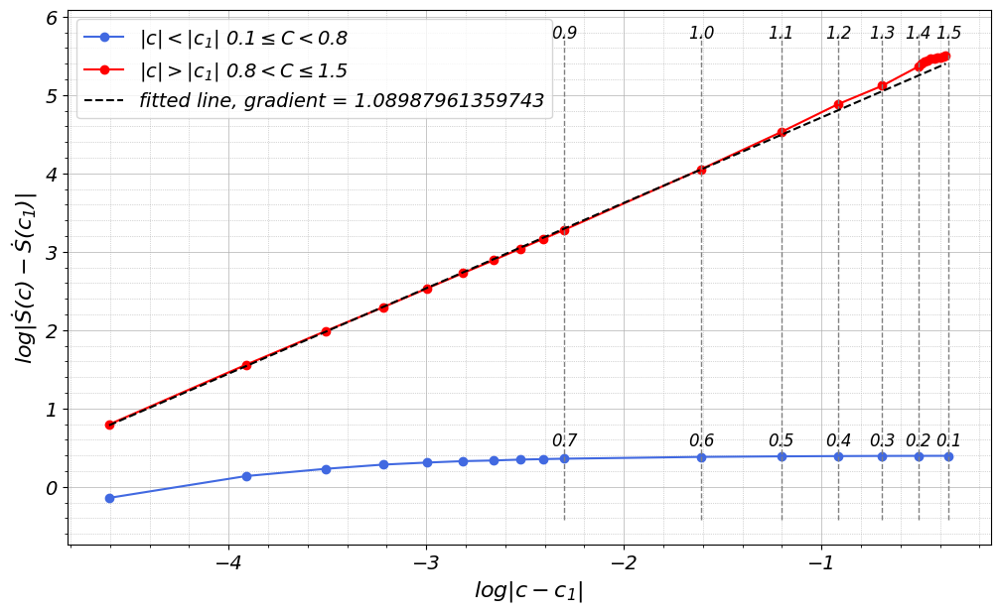

In [ ]:
# c_1
# calculate
c_index = 1
S_thres = S_plot[ind1]
log_c_prev = np.log(np.abs(range1-c1))
log_c_after = np.log(np.abs(range2-c1))
log_S_prev = np.log(np.abs(S_plot[:ind1]-S_thres))
log_S_after = np.log(np.abs(S_plot[ind1+1:ind2]-S_thres))

# plot
fig, ax1 = plt.subplots(figsize=(12,7))
ax1.plot(log_c_prev, log_S_prev, label=r'$|c| < |c_{%i}|$ $0.1 \leq C < 0.8$'%c_index, color = 'royalblue', marker='o')
ax1.plot(log_c_after, log_S_after, label=r'$|c| > |c_{%i}|$ $0.8 < C \leq 1.5$'%c_index, color = 'red', marker='o')

# label
label_c = np.linspace(-0.1, -0.7, 7)
log_label = np.log(np.abs(label_c - c1))

label_c_2 = np.linspace(-1.5, -0.9, 7)
log_label_2 = np.log(np.abs(label_c_2 - c1))

ymin, ymax = ax1.get_ylim()
ax1.vlines(x=log_label, ymin=ymin, ymax=ymax, color='gray', linestyle='--', linewidth=1.0)
for i,j in enumerate(log_label):
  ax1.text(j, 0.7, f'{-label_c[i]:.1f}', ha='center', va='top', fontsize=12)
for i,j in enumerate(log_label_2):
  ax1.text(j, 5.9, f'{-label_c_2[i]:.1f}', ha='center', va='top', fontsize=12)
# ax1.text(-3, 0.7, 'C values', ha='center', va='top')
# ax1.text(-3, 5.7, 'C values', ha='center', va='top')

# best fit line
a, b = np.polyfit(log_c_after[:12], log_S_after[:12], 1)
ax1.plot(log_c_after, a*log_c_after+b, label=f"fitted line, gradient = {a}", color='black', linestyle='--')

# grids
plt.minorticks_on()
plt.grid(which='both', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5')

# label and tile
ax1.set_xlabel(r'$log|c - c_1|$', fontsize=16)
ax1.set_ylabel(r'$log|\dot{S}(c)-\dot{S}(c_{%i})|$'%c_index, fontsize=16)
ax1.legend()
# ax1.set_title(r'Log-log Plot,  $c_{%i}$ = 0.8'%c_index)
plt.show()

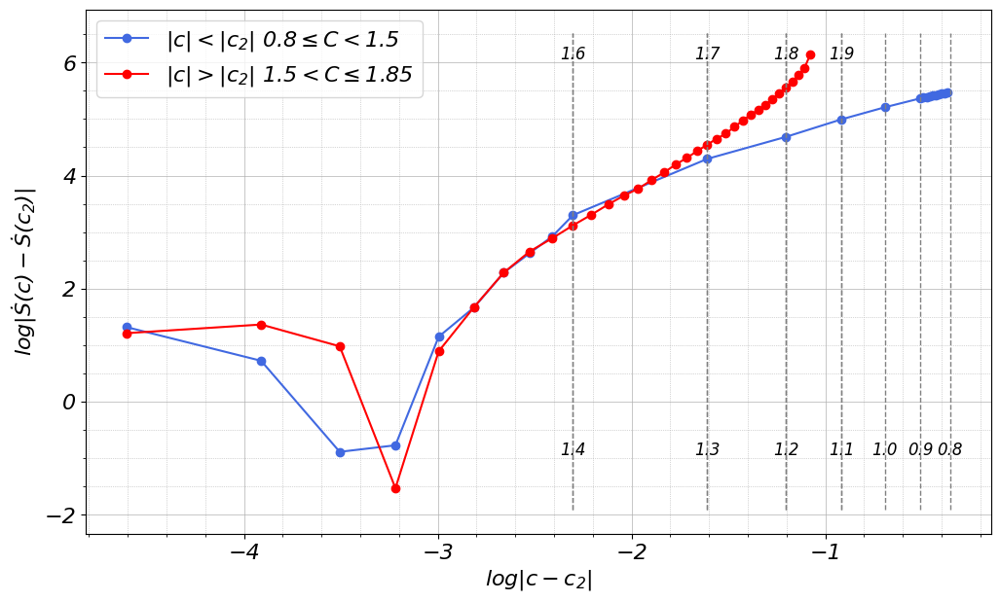

In [ ]:
# c_2
c_index = 2
S_thres = S_plot[ind2]
log_c_prev = np.log(np.abs(range2-c2))
log_c_after = np.log(np.abs(range3-c2))
log_S_prev = np.log(np.abs(S_plot[ind1+1:ind2]-S_thres))
log_S_after = np.log(np.abs(S_plot[ind2+1:ind3]-S_thres))

# plot
fig, ax1 = plt.subplots(figsize=(12,7))
ax1.plot(log_c_prev, log_S_prev, label=r'$|c| < |c_{%i}|$ $0.8 \leq C < 1.5$'%c_index, color = 'royalblue', marker='o')
ax1.plot(log_c_after, log_S_after, label=r'$|c| > |c_{%i}|$ $1.5 < C \leq 1.85$'%c_index, color = 'red', marker='o')

# label
label_c = np.linspace(-0.8, -1.4, 7)
log_label = np.log(np.abs(label_c - c2))

label_c_2 = np.linspace(-1.9, -1.6, 4)
log_label_2 = np.log(np.abs(label_c_2 - c2))

ymin, ymax = ax1.get_ylim()
ax1.vlines(x=log_label, ymin=ymin, ymax=ymax, color='gray', linestyle='--', linewidth=1.0)
ax1.vlines(x=log_label_2, ymin=ymin, ymax=ymax, color='gray', linestyle='--', linewidth=1.0)
for i,j in enumerate(log_label):
  ax1.text(j, -0.7, f'{-label_c[i]:.1f}', ha='center', va='top', fontsize=12)
for i,j in enumerate(log_label_2):
  ax1.text(j, 6.3, f'{-label_c_2[i]:.1f}', ha='center', va='top', fontsize=12)

# grids
plt.minorticks_on()
plt.grid(which='both', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5')

# label and title
ax1.set_xlabel(r'$log|c - c_2|$')
ax1.set_ylabel(r'$log|\dot{S}(c)-\dot{S}(c_{%i})|$'%c_index)
ax1.legend()
# ax1.set_title(r'Log-log Plot,  $c_{%i}$ = 1.5'%(c_index))
plt.show()

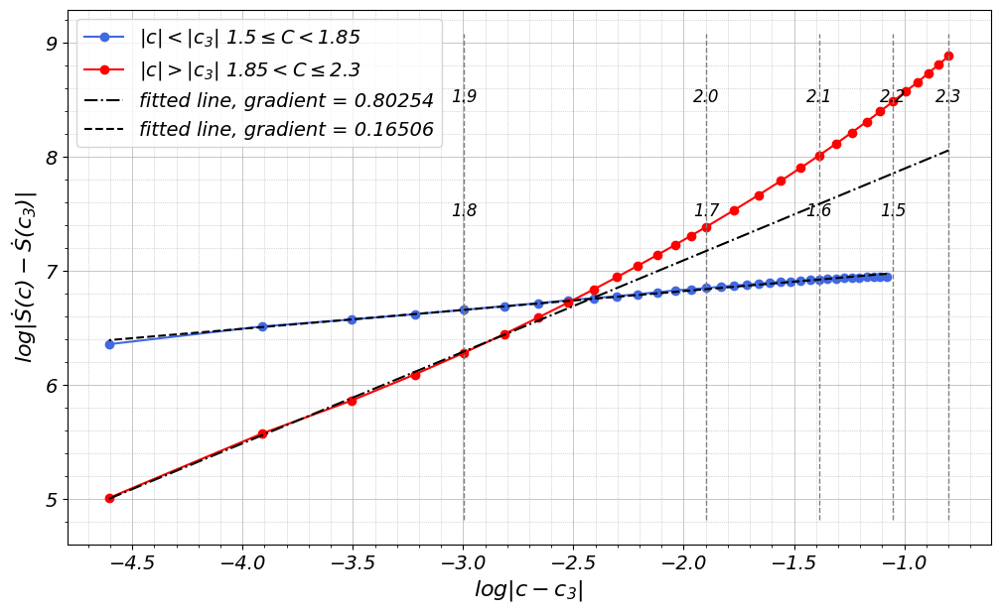

In [ ]:
# c_3
c_index = 3
S_thres = S_plot[ind3]
log_c_prev = np.log(np.abs(range3-c3))
log_c_after = np.log(np.abs(range4-c3))
log_S_prev = np.log(np.abs(S_plot[ind2+1:ind3]-S_thres))
log_S_after = np.log(np.abs(S_plot[ind3+1:]-S_thres))

# plot
fig, ax1 = plt.subplots(figsize=(12,7))
ax1.plot(log_c_prev, log_S_prev, label=r'$|c| < |c_{%i}|$ $1.5 \leq C < 1.85$'%c_index, color = 'royalblue', marker='o')
ax1.plot(log_c_after, log_S_after, label=r'$|c| > |c_{%i}|$ $1.85 < C \leq 2.3$'%c_index, color = 'red', marker='o')

# label
label_c = np.linspace(-1.5, -1.8, 4)
log_label = np.log(np.abs(label_c - c3))

label_c_2 = np.linspace(-2.3, -1.9, 5)
log_label_2 = np.log(np.abs(label_c_2 - c3))

# vertical lines
ymin, ymax = ax1.get_ylim()
ax1.vlines(x=log_label_2, ymin=ymin, ymax=ymax, color='gray', linestyle='--', linewidth=1)
for i,j in enumerate(log_label):
  ax1.text(j, 7.6, f'{-label_c[i]:.1f}', ha='center', va='top', fontsize=12)
for i,j in enumerate(log_label_2):
  ax1.text(j, 8.6, f'{-label_c_2[i]:.1f}', ha='center', va='top', fontsize=12)

# line of best fit
a_after, b_after = np.polyfit(log_c_after[:7], log_S_after[:7], 1)
ax1.plot(log_c_after, a_after*log_c_after+b_after, label=f'fitted line, gradient = {a_after:.5f}', color='black', linestyle='dashdot')
a_prev, b_prev = np.polyfit(log_c_prev, log_S_prev, 1)
ax1.plot(log_c_prev, a_prev*log_c_prev+b_prev, label=f'fitted line, gradient = {a_prev:.5f}', color='black', linestyle='--')

# grids
plt.minorticks_on()
plt.grid(which='both', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5')

# label and title
ax1.set_xlabel(r'$log|c - c_3|$', fontsize=16)
ax1.set_ylabel(r'$log|\dot{S}(c)-\dot{S}(c_{%i})|$'%c_index, fontsize=16)
ax1.legend()
# ax1.set_title(r'Log-log plot,  $c_{%i}$ = 1.85'%(c_index))
plt.show()

# One Mode Approximation

## Fast Fourier Transform

Estimate the solution by one Fourier mode. FFT gives the frequencies, amplitudes and offsets.

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 15000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
def fft_magnitude(c, plot=True):
    '''
    Input: value of C
    '''
    par.C = c
    x, t, u1, v1 = BVAM(par, noise=False)

    # Compute FFT along the spatial axis for u and v
    u_fft_space = np.fft.fft(u1[:, -1])#- np.mean(u1[:, -1]))
    v_fft_space = np.fft.fft(v1[:, -1])#- np.mean(v1[:, -1]))

    u_fft_space_1 = np.fft.fft(u1[:, -5])
    v_fft_space_1 = np.fft.fft(v1[:, -5])

    # Compute magnitude (amplitude) of FFTc
    u_fft_magnitude = np.abs(u_fft_space) / (par.N/2)
    v_fft_magnitude = np.abs(v_fft_space) / (par.N/2)

    u_fft_magnitude_1 = np.abs(u_fft_space_1) / (par.N/2)
    c_1 = np.abs(u_fft_space_1[0]) / len(u1[:, -1])
    v_fft_magnitude_1 = np.abs(v_fft_space_1) / (par.N/2)
    c_2 = np.abs(v_fft_space_1[0]) / len(v1[:, -1])

    if plot:
        # Compute frequency axis and wavenumbers
        Ny = len(u_fft_space)
        freqs = np.fft.fftfreq(Ny, d=par.dx)
        wavenumbers = 2 * np.pi * freqs

        # Reorder the wavenumbers and corresponding magnitudes for proper plotting
        indices = np.fft.fftshift(np.arange(Ny))
        wavenumbers = np.fft.fftshift(wavenumbers)
        u_fft_magnitude = np.fft.fftshift(u_fft_magnitude)
        v_fft_magnitude = np.fft.fftshift(v_fft_magnitude)

        # Set up tick placement
        max_wavenumber = np.pi * (int(max(wavenumbers) / np.pi) + 1)  # find the next multiple of π
        ticks = np.arange(-max_wavenumber, max_wavenumber + np.pi/2, np.pi/2)
        tick_labels = [f"{n:.1f}π" if n != 0 else "0" for n in ticks / np.pi]

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

        for ax in axes:
            ax.plot(wavenumbers, u_fft_magnitude if ax == axes[0] else v_fft_magnitude, marker='o', color='royalblue')
            ax.set_xlabel('Wavenumber (k)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'Amplitude versus Wavenumber for {"u" if ax == axes[0] else "v"}')
            ax.set_xticks(ticks)
            ax.set_xticklabels(tick_labels)
            ax.minorticks_on()
            ax.set_xlim(-3*np.pi, 3*np.pi)
            ax.grid(True)

        plt.tight_layout()
        plt.show()

        print(f'The largest amplitude of u is {max(u_fft_magnitude)}')
        print(f'The largest amplitude of v is {max(v_fft_magnitude)}')
        # print(wavenumbers[np.argmax(v_fft_magnitude)]/np.pi)
    else:
        return u_fft_magnitude_1, v_fft_magnitude_1, c_1, c_2

### Static

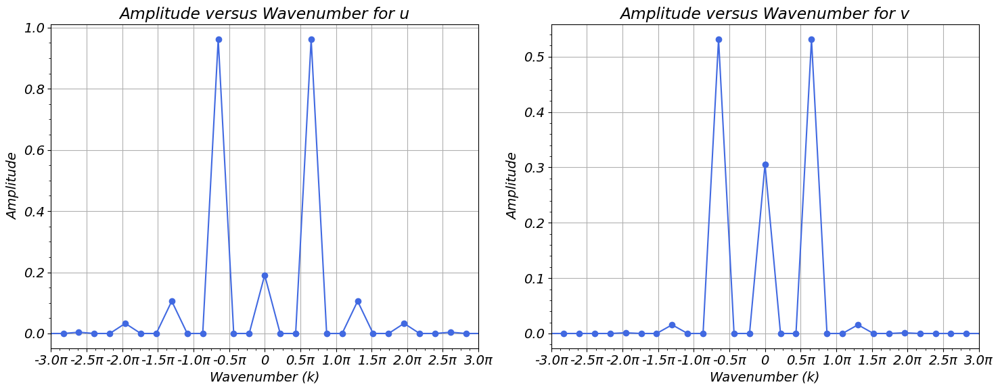

The largest amplitude of u is 0.9616921802383012
The largest amplitude of v is 0.5314156680150872


In [ ]:
fft_magnitude(-0.6, plot=True)

### two dimensional FFT

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 20000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
par.C = -1.2
x,t,u,v = BVAM(par, noise=False)

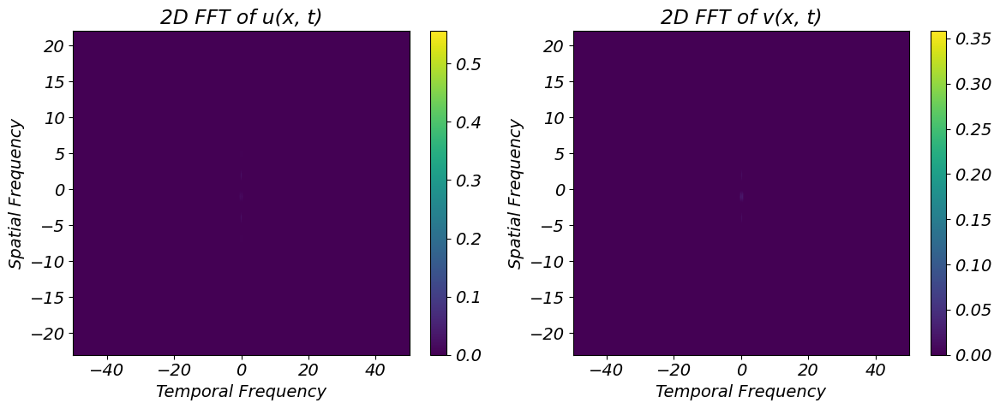

In [ ]:
# Perform the FFT on detrended data
u_fft_2d = np.fft.fftshift(np.fft.fft2(u[:,10000:]))
v_fft_2d = np.fft.fftshift(np.fft.fft2(v[:,10000:]))
u_magnitude = np.abs(u_fft_2d) / (par.N * (par.Nt-10000))
v_magnitude = np.abs(v_fft_2d) / (par.N * (par.Nt-10000))

k = 2 * np.pi * np.fft.fftfreq(u.shape[0], d=2*np.pi/par.N)
f = np.fft.fftfreq(u.shape[1]-10001, d=0.01)

# shift the zero to the center
k = np.fft.fftshift(k)  # Spatial frequencies (wavenumbers)
f = np.fft.fftshift(f)
extent = [f.min(), f.max(), k.min(), k.max()]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
# plt.contourf(f, k, u_magnitude, cmap='viridis', origin='lower')
plt.imshow(u_magnitude, aspect='auto', extent=extent)
plt.title('2D FFT of u(x, t)')
plt.xlabel('Temporal Frequency')
plt.ylabel('Spatial Frequency')
# plt.xlim(-10, 10)
plt.colorbar()

plt.subplot(1, 2, 2)
# plt.contourf(f, k, v_magnitude, cmap='viridis', origin='lower')
plt.imshow(v_magnitude, aspect='auto', extent=extent)
plt.title('2D FFT of v(x, t)')
plt.xlabel('Temporal Frequency')
plt.ylabel('Spatial Frequency')
# plt.xlim(-10, 10)
plt.colorbar()

plt.tight_layout()
plt.show()

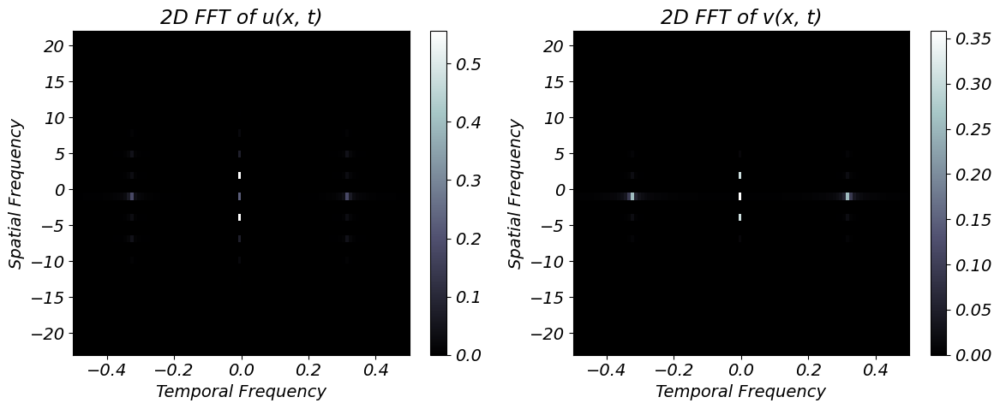

In [ ]:
plt.figure(figsize=(12, 5))

extent = [f.min(), f.max(), k.min(), k.max()]
plt.subplot(1, 2, 1)
plt.imshow(u_magnitude, aspect='auto', cmap='bone', extent=extent)
plt.title('2D FFT of u(x, t)')
plt.xlabel('Temporal Frequency')
plt.ylabel('Spatial Frequency')
plt.xlim(-0.5, 0.5)
# plt.axhline(-2*np.pi/3, color='white')
# plt.axhline(2*np.pi/3, color='white')
# plt.grid()
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(v_magnitude, aspect='auto', cmap='bone', extent=extent)
plt.title('2D FFT of v(x, t)')
plt.xlabel('Temporal Frequency')
plt.ylabel('Spatial Frequency')
plt.xlim(-0.5, 0.5)
# plt.axhline(-2*np.pi/3, color='white')
# plt.axhline(2*np.pi/3, color='white')
plt.colorbar()
# plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
# finding dominant mode
np.where(u_magnitude == np.max(u_magnitude[21:25, :4999]))

(array([23, 23]), array([4968, 5032]))

In [ ]:
f[4968]

-0.32

In [ ]:
def FFT_magnitude_2d(c):
    par.C = c
    x,t,u,v = BVAM(par, noise=False)
    Nx = par.N
    Nt = par.Nt-10000

    u_fft_2d = np.fft.fftshift(np.fft.fft2(u[:,10000:]))
    v_fft_2d = np.fft.fftshift(np.fft.fft2(v[:,10000:]))
    u_magnitude = np.abs(u_fft_2d) / (par.N * (Nt/2))
    v_magnitude = np.abs(v_fft_2d) / (par.N * (Nt/2))

    # b_u, b_v
    b_u = u_magnitude[Nx//2, Nt//2]
    b_v = v_magnitude[Nx//2, Nt//2]
    # A_u, B_u
    A_u = u_magnitude[20, Nt//2]
    B_u = np.max(u_magnitude[Nx//2, :Nt//2-1])
    # A_v, B_v
    A_v = v_magnitude[20, Nt//2]
    B_v = np.max(v_magnitude[Nx//2, :Nt//2-1])

    return [A_u, B_u, A_v, B_v, b_u, b_v]

In [ ]:
coeff = FFT_magnitude_2d(-1.2)

In [ ]:
coeff

[0.5567060550401519,
 0.18233189353881396,
 0.3075852628089801,
 0.25451749091594555,
 0.22309161542044667,
 0.3618978612705908]

Also we looked at 1D FFT to confirm.

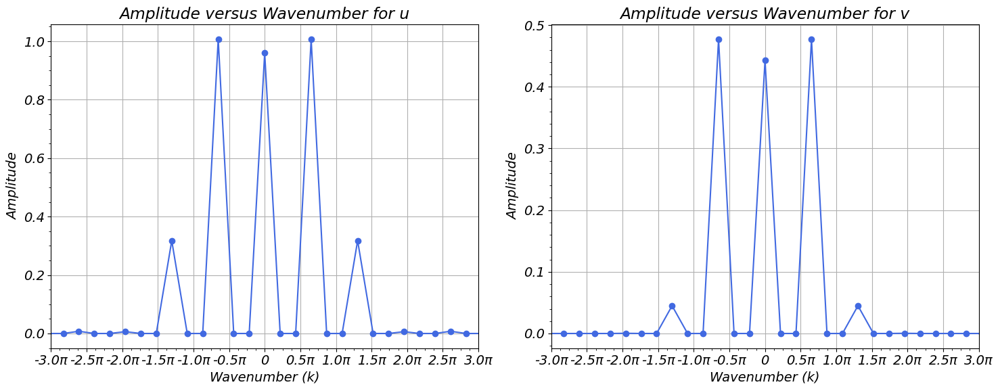

The largest amplitude of u is 1.006842216353818
The largest amplitude of v is 0.4769416128698774


In [ ]:
par.C = -1.2
x, t, u1, v1 = BVAM(par, noise=False)

# Compute FFT along the spatial axis for u and v
u_fft_space_1 = np.fft.fft(u1[:, -5])
v_fft_space_1 = np.fft.fft(v1[:, -5])

u_fft_magnitude_1 = np.abs(u_fft_space_1) / (par.N/2)
c_1 = np.abs(u_fft_space_1[0]) / len(u1[:, -1])
v_fft_magnitude_1 = np.abs(v_fft_space_1) / (par.N/2)
c_2 = np.abs(v_fft_space_1[0]) / len(v1[:, -1])

# Compute frequency axis and wavenumbers
Ny = len(u_fft_space_1)
freqs = np.fft.fftfreq(Ny, d=par.dx)
wavenumbers = 2 * np.pi * freqs

# Reorder the wavenumbers and corresponding magnitudes for proper plotting
indices = np.fft.fftshift(np.arange(Ny))
wavenumbers = np.fft.fftshift(wavenumbers)
u_fft_magnitude = np.fft.fftshift(u_fft_magnitude_1)
v_fft_magnitude = np.fft.fftshift(v_fft_magnitude_1)

# Set up tick placement
max_wavenumber = np.pi * (int(max(wavenumbers) / np.pi) + 1)  # find the next multiple of π
ticks = np.arange(-max_wavenumber, max_wavenumber + np.pi/2, np.pi/2)
tick_labels = [f"{n:.1f}π" if n != 0 else "0" for n in ticks / np.pi]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

for ax in axes:
    ax.plot(wavenumbers, u_fft_magnitude if ax == axes[0] else v_fft_magnitude, marker='o', color='royalblue')
    ax.set_xlabel('Wavenumber (k)')
    ax.set_ylabel('Amplitude')
    ax.set_title(f'Amplitude versus Wavenumber for {"u" if ax == axes[0] else "v"}')
    ax.set_xticks(ticks)
    ax.set_xticklabels(tick_labels)
    ax.minorticks_on()
    ax.set_xlim(-3*np.pi, 3*np.pi)
    ax.grid(True)

plt.tight_layout()
plt.show()

print(f'The largest amplitude of u is {max(u_fft_magnitude)}')
print(f'The largest amplitude of v is {max(v_fft_magnitude)}')

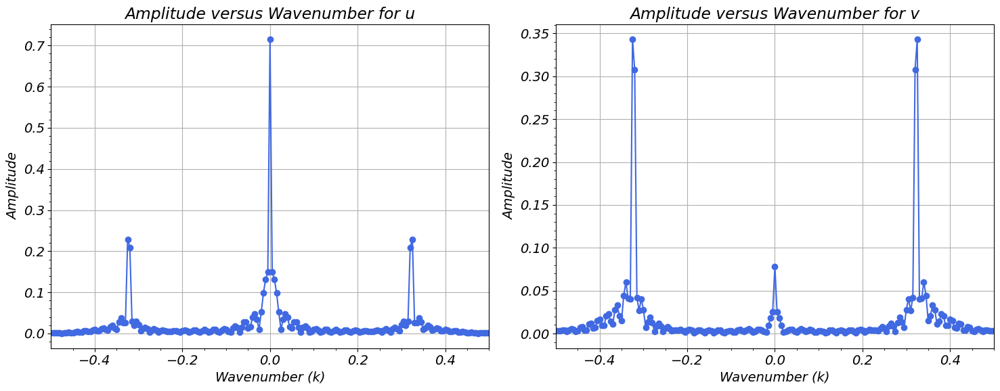

The largest amplitude of u is 0.715228782217139
The largest amplitude of v is 0.3431640531012004


In [ ]:
par.C = -1.2
x, t, u1, v1 = BVAM(par, noise=False)

# Compute FFT along the spatial axis for u and v
u_fft_space_1 = np.fft.fft(u1[-5, :])
v_fft_space_1 = np.fft.fft(v1[-5, :])

u_fft_magnitude_1 = np.abs(u_fft_space_1) / (par.Nt/2)
c_1 = np.abs(u_fft_space_1[0]) / len(u1[-5, :])
v_fft_magnitude_1 = np.abs(v_fft_space_1) / (par.Nt/2)
c_2 = np.abs(v_fft_space_1[0]) / len(v1[-5, :])

# Compute frequency axis and wavenumbers
Ny = len(u_fft_space_1)
freqs = np.fft.fftfreq(Ny, d=par.dt)
freqs = np.fft.fftshift(freqs)

# Reorder the wavenumbers and corresponding magnitudes for proper plotting
indices = np.fft.fftshift(np.arange(Ny))
u_fft_magnitude = np.fft.fftshift(u_fft_magnitude_1)
v_fft_magnitude = np.fft.fftshift(v_fft_magnitude_1)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

for ax in axes:
    ax.plot(freqs, u_fft_magnitude if ax == axes[0] else v_fft_magnitude, marker='o', color='royalblue')
    ax.set_xlabel('Wavenumber (k)')
    ax.set_ylabel('Amplitude')
    ax.set_title(f'Amplitude versus Wavenumber for {"u" if ax == axes[0] else "v"}')
    # ax.set_xticks(ticks)
    # ax.set_xticklabels(tick_labels)
    ax.minorticks_on()
    ax.set_xlim(-0.5, 0.5)
    ax.grid(True)

plt.tight_layout()
plt.show()

print(f'The largest amplitude of u is {max(u_fft_magnitude)}')
print(f'The largest amplitude of v is {max(v_fft_magnitude)}')

## Numerics VS One mode approximation

### Deterministic Solutions

#### Static

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 200000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
# Static
par.C = -0.5
u_mag, v_mag, d1, d2 = fft_magnitude(par.C, plot=False)
_, _, u, v = BVAM(par, noise=False)
_, _, u_noised, v_noised = BVAM(par, noise=None)

In [ ]:
x = np.linspace(0, 9, 46)
t = np.linspace(0, 2000, 200001)

# phase shift
a = x[np.argmax(u[:, -10])]
b = x[np.argmax(v[:, -10])]

U_static_noise = np.max(u_mag)*np.cos(0.65217*np.pi*(x-a)) + d1
V_static_noise = np.max(v_mag)*np.cos(0.65217*np.pi*(x-b)) + d2

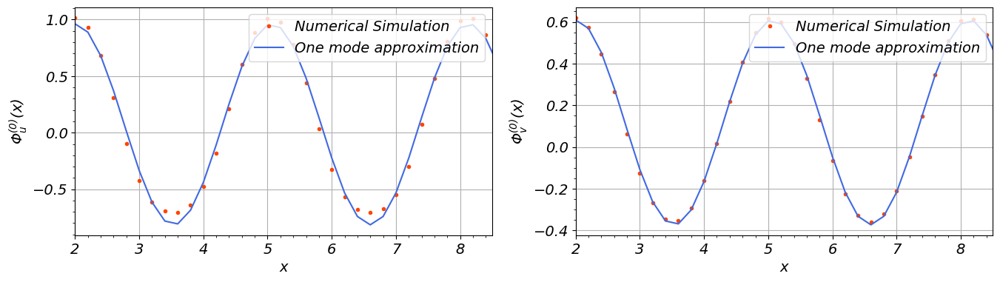

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))

axes[0].plot(x, u[:, -5], '.', color='orangered', label='Numerical Simulation')
axes[0].plot(x, U_static_noise, color='royalblue', label='One mode approximation')
axes[0].set_xlabel('x')
axes[0].set_ylabel(r'$\Phi_u^{(0)}\left(x\right)$')
axes[0].minorticks_on()
axes[0].set_xlim(2, 8.5)
axes[0].grid()
axes[0].legend(loc='upper right')

axes[1].plot(x, v[:, -5], '.', color='orangered', label='Numerical Simulation')
axes[1].plot(x, V_static_noise, color='royalblue', label='One mode approximation')
axes[1].set_xlabel('x')
axes[1].set_ylabel(r'$\Phi_v^{(0)}\left(x\right)$')
axes[1].minorticks_on()
axes[1].set_xlim(2, 8.5)
axes[1].grid()
axes[1].legend(loc='upper right')

plt.show()

#### Travelling wave / Oscillatory Region

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 20000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
par.C = -1.2
_, _, u, v = BVAM(par, noise=False)
coeff = FFT_magnitude_2d(-1.2)

In [ ]:
x = np.linspace(0, 9, 46)
t = np.linspace(0, 200, 20001)
T, X = np.meshgrid(t, x)

u_tw = coeff[0]*np.cos(0.652*np.pi*X) + coeff[1]*np.cos(0.32*2*np.pi*T) + coeff[4]
v_tw = coeff[2]*np.cos(0.652*np.pi*X) + coeff[3]*np.cos(0.32*2*np.pi*T) + coeff[5]

Y = 0.7*np.cos(0.652*np.pi*X+0.6) + 0.18*np.cos(0.32*2*np.pi*T)

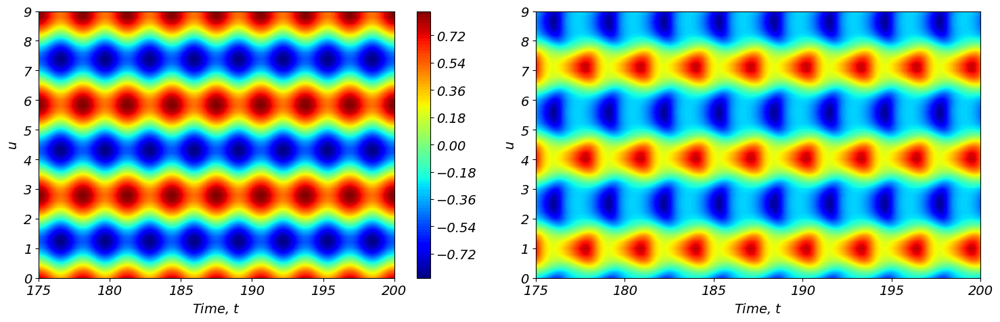

In [ ]:
fig, ax1 = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
c1 = ax1[0].contourf(T, X, Y, 100, cmap ="jet")
cbar1 = fig.colorbar(c1,ax=ax1[0])
ax1[0].set_ylabel(r'$u$')
ax1[0].set_xlabel(r'Time, $t$')
ax1[0].set_xlim(175,200)
ax1[1].contourf(T, X, u, 100, cmap ="jet")
ax1[1].set_ylabel(r'$u$')
ax1[1].set_xlabel(r'Time, $t$')
ax1[1].set_xlim(175,200)

# fig.suptitle(r"$\Delta t = 0.01$", fontsize = 18)
fig.tight_layout()
plt.show()

### EPR Comparison

#### Computing the Amplitudes and Offsets

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 20000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
C_static = np.linspace(-0.1, -0.8, 8)
Au = []
Av = []
bu = []
bv = []

for c in C_static:
  u_mag, v_mag, d1, d2 = fft_magnitude(c, plot=False)
  Au.append(np.max(u_mag))
  Av.append(np.max(v_mag))
  bu.append(d1)
  bv.append(d2)

Au = np.array(Au)
Av = np.array(Av)
bu = np.array(bu)
bv = np.array(bv)

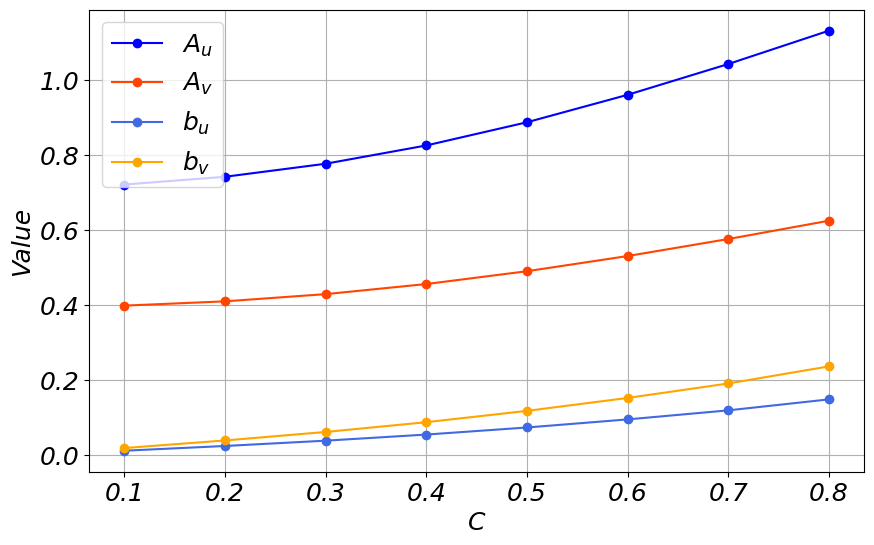

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(-C_static, Au, label=r'$A_u$', color='b', marker='o')
plt.plot(-C_static, Av, label=r'$A_v$', color='orangered', marker='o')
plt.plot(-C_static, bu, label=r'$b_u$', color='royalblue', marker='o')
plt.plot(-C_static, bv, label=r'$b_v$', color='orange', marker='o')
# plt.title("Amplitude of u, v Change With C")
plt.ylabel(r"Value")
plt.xlabel("C")
plt.legend(loc="upper left")
plt.grid()

In [ ]:
C_osc = np.linspace(-0.8, -1.5, 8)
Coeff_array = np.zeros((6, 8))

for i, c in enumerate(C_osc):
  coeff = FFT_magnitude_2d(c)
  Coeff_array[:,i] = np.array(coeff)

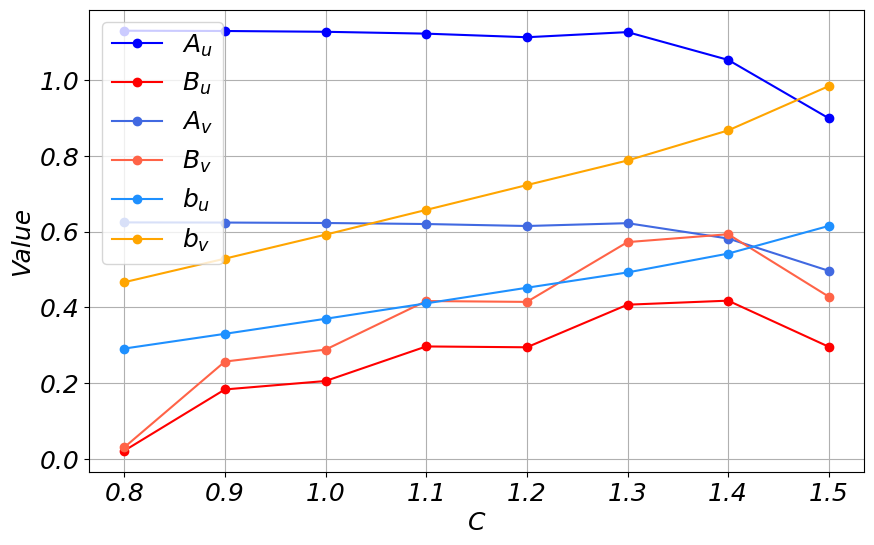

In [ ]:
plt.figure(figsize=(10,6))
colors = ['b','r','royalblue','tomato','dodgerblue','orange']
labels = [r'$A_u$', r'$B_u$',r'$A_v$',r'$B_v$',r'$b_u$',r'$b_v$']

for i in range(6):
  plt.plot(-C_osc, Coeff_array[i,:], label=labels[i], color=colors[i], marker='o')

plt.ylabel(r"Value")
plt.xlabel("C")
plt.legend()
plt.grid()

#### Numerical Computed EPR

In [ ]:
# def x_integral(u, v, par):
#   eta = 1
#   alpha = -1
#   beta = -3/2

#   # diffusion term
#   lap_u = (u[2:] -2*u[1:-1]+ u[:-2]) / (par.dx**2)
#   lap_v = (v[2:] -2*v[1:-1]+ v[:-2]) / (par.dx**2)

#   # mu: drop boundary
#   u_nb = u[1:-1]
#   v_nb = v[1:-1]

#   mu_u = par.D * lap_u + eta * (u_nb + alpha*v_nb - par.C*u_nb*v_nb - u_nb*v_nb**2)
#   mu_v = lap_v + eta * (beta*v_nb + par.H*u_nb + par.C*u_nb*v_nb + u_nb*v_nb**2)

#   ito_sum = mu_u**2 + mu_v**2

#   Sum = np.sum(ito_sum) * par.dx

#   return Sum

In [ ]:
# x = np.linspace(0, 9, 46)
# t = np.linspace(0, 3000, 300001)
# T, X = np.meshgrid(t, x)
# EPR_numerical_static = []

# for i in range(8):
#   par.C = C_static[i]
#   U = Au[i] * np.cos(2 * np.pi * X / 3) + bu[i]
#   V = Av[i] * np.cos(2 * np.pi * X / 3) + bv[i]
#   EPR = sum_term(U, V, par, drop=int(2e5))
#   EPR_numerical_static.append(EPR[-1]/(0.08*1000))

In [ ]:
class params:
    pass

par = params()
par.L = 9.0
par.N = 46
par.Nt = 300000
par.dt = 0.01
par.dx = 0.2
par.H = 3
par.D = 0.08

In [ ]:
def One_Mode_EPR(A_u, A_v, b_u, b_v, drop=int(2e5), para=par):
  '''
  mean_entropy_over_noise: entropy production rate we want
  entropy_values_store: each value is a entropy production rate for one realisation
  NOTE: Need to set par.Nt > drop
  '''
  # calculate entropy production rate
  ts = np.linspace(0, para.dt*para.Nt, para.Nt+1)
  xs = np.linspace(0, para.L, para.N)
  T, X = np.meshgrid(ts, xs)
  us = A_u * np.cos(2 * np.pi * X / 3) + b_u
  vs = A_v * np.cos(2 * np.pi * X / 3) + b_v
  Sum1 = sum_term(us, vs, para, drop=drop)

  # use Ito integral
  entropy_values_store = Sum1 / (para.D * ts[2000:(para.Nt-drop)+1:2000])

  return entropy_values_store[-1]

In [ ]:
EPR_numerical_static = []

for i in range(8):
  par.C = C_static[i]
  EPR = One_Mode_EPR(Au[i], Av[i], bu[i], bv[i])
  EPR_numerical_static.append(EPR)

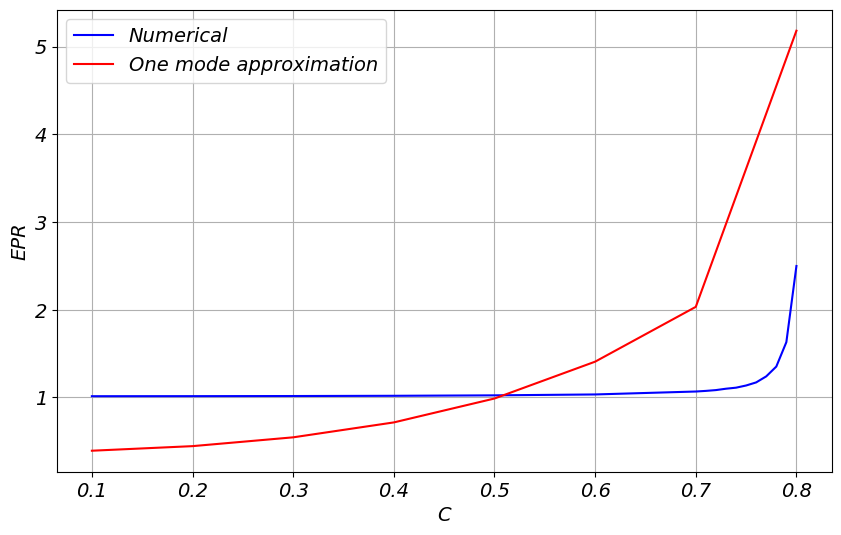

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(-C_val[:ind1+1], S_plot[:ind1+1], color='b', label='Numerical')
plt.plot(-C_static, np.array(EPR_numerical_static), color='red', label='One mode approximation')
# plt.plot(- C_static, np.array(S_expr)*0.01, color='green', label='Expression from Mathematica')

# plt.title("Amplitude of u, v Change With C")
plt.ylabel(r"EPR")
plt.xlabel("C")
plt.legend()
plt.grid()

In [ ]:
x = np.linspace(0, 9, 46)
t = np.linspace(0, 3000, 300001)
T, X = np.meshgrid(t, x)
EPR_numerical_osc = []

for i in range(8):
  par.C = C_osc[i]
  U = Coeff_array[0, i] * np.cos(2 * np.pi * X / 3) + Coeff_array[1, i]*np.cos(0.64*np.pi*T) + Coeff_array[4, i]
  V = Coeff_array[2, i] * np.cos(2 * np.pi * X / 3) + Coeff_array[3, i]*np.cos(0.64*np.pi*T) + Coeff_array[5, i]
  EPR = sum_term(U, V, par, drop=int(2e5))
  EPR_numerical_osc.append(EPR[-1]/(0.08*1000))

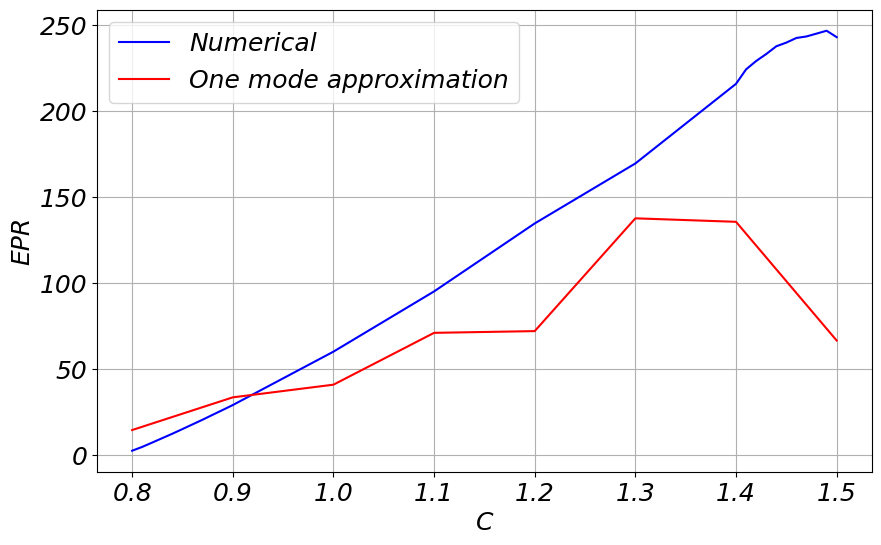

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(-C_val[ind1:ind2+1], S_plot[ind1:ind2+1], color='b', label='Numerical')
plt.plot(-C_osc, np.array(EPR_numerical_osc), color='red', label='One mode approximation')
# plt.plot(-C_osc, np.array(S_expr_osc), color='green', label='Derived Expression')

# plt.title("Amplitude of u, v Change With C")
plt.ylabel(r"EPR")
plt.xlabel("C")
plt.legend()
plt.grid()

#### Analytical EPR

(Using Mathematica Expressions)

In [ ]:
# Expression from mathematica
def expression_static(Au, Av, bu, bv, c):
    pi = np.pi
    delta_C = np.abs(c - 0.8)

    term1 = Au**2 * (
        (pi**2 * (3 * Av**2 + 4 * bv**2 - 16/5 * bv - 4) +
        225/16 * (5 * Av**4 + 36/25 * Av**2 * (25 * bv**2 - 20 * bv + 11) +
        8 * (bv - 4/5) * bv * (bv**2 - 4 * bv / 5 + 2) + 40) + 256 * pi**4)
    )

    term2 = 1/8 * Au * Av * (
        75 * (Av**2 * (72 * bu * bv - 144 * bu / 5 + 3) +
        48 * bu * (2 * bv - 4/5) * (bv**2 - 4 * bv / 5 + 1) + 12 * bv**2 - 32 * bv / 5 - 36) -
        4/5 * pi**2 * (375 * Av**2 - 80 * bu * bv + 32 * bu + 500 * bv**2 - 400 * bv + 1460)
    )

    term3 = (
        675/8 * Av**4 * bu**2 + 2 * Av**2 * (
            3/4 * bu * (450 * bu * bv**2 - 360 * bu * bv + 198 * bu + 75 * bv - 20) -
            pi**2 * (10 * bu * bv - 4 * bu - 10/3) + 50/9 * pi**4 + 325/8
        ) + 1125 * bu**2 +
        25/2 * bv * (
            6 * bu * ((bv - 4/5) * (3 * bu * (bv**2 - 4 * bv / 5 + 2) + bv) - 9) + 13 * bv
        )
    )

    term4 = delta_C * (
        Au**2 * (2025/4 * Av**2 * bv - 135 * Av**2 + 225 * bv**3 - 180 * bv**2 + 4 * pi**2 * bv + 225 * bv) +
        Au * Av * (675/2 * Av**2 * bu + 1350 * bu * bv**2 - 720 * bu * bv + 4 * pi**2 * bu + 450 * bu - 50 * pi**2 * bv + 75 * bv) -
        2 * Av**2 * (25 * pi**2 * bu - 15/4 * bu * (90 * bu * bv - 24 * bu + 5)) -
        15 * bu * bv * (-30 * bu * bv**2 + 24 * bu * bv - 30 * bu - 5 * bv)
    )

    term5 = 225/8 * delta_C**2 * (
        3 * Au**2 * Av**2 + 4 * Au**2 * bv**2 + 16 * Au * Av * bu * bv + 4 * Av**2 * bu**2 + 8 * bu**2 * bv**2
    )

    # Calculate the total S dot
    S_dot = term1 + term2 + term3 # + term4 + term5

    return S_dot


In [ ]:
# Expression from mathematica
def expression_oscillatory(Coeff_array, c):
    delta_C = np.abs(c - 0.8)
    Au, Bu, Av, Bv, bu, bv = Coeff_array

    # Complex expression broken down for clarity
    term1 = Au**2 * (70.3125 * Av**4 + Av**2 * (506.25 * bv**2 + 405 * bv + 253.125 * Bv**2 + 252.359) +
                     112.5 * bv**4 + 180 * bv**3 + bv**2 * (337.5 * Bv**2 + 336.478) +
                     0.8 * bv * (337.5 * Bv**2 + 264.478) + Bv**2 * (42.1875 * Bv**2 + 168.239) + 529.948)

    term2 = Au * Av * (Av**2 * (675 * bu * bv + 270 * bu + 337.5 * Bu * Bv - 341.985) +
                       bv**2 * (1080 * bu + 1350 * Bu * Bv - 380.98) +
                       bv * (1350 * bu * Bv**2 + 288 * bu + 1080 * Bu * Bv - 334.784) +
                       Bv * ((540 * bu - 190.49) * Bv + 337.5 * Bu * Bv**2 + 144 * bu) +
                       900 * bu * bv**3 + 978.957 * bu * bv + 391.583 * bu + 489.478 * Bu * Bv - 1778.46)

    term3 = Av**4 * (84.375 * bu**2 + 42.1875 * Bu**2) + \
            Av**2 * (bu**2 * (675 * bv**2 + 540 * bv + 337.5 * Bv**2 + 297) +
                     Bu * bv * (1350 * Bu * Bv - 874.46) + 0.8 * bu * (675 * Bu * Bv - 455.98) +
                     Bu**2 * (337.5 * bv**2 + 270 * bv + 253.125 * Bv**2 + 148.5) - 437.23 * Bu * Bv + 1492.56)

    term4 = Bv**2 * (bu**2 * (675 * bv**2 + 225) + 112.5 * Bu * bv + Bu**2 * (506.25 * bv**2 + 168.75) + 81.25) + \
            0.64 * (bu**2 * (225 * bv**2 + 112.5 * Bv**2) + 450 * bu * Bu * bv * Bv + Bu**2 * (112.5 * bv**2 + 84.375 * Bv**2)) + \
            bv * (bu**2 * bv * (225 * bv**2 + 450) + bu * (75 * bv**2 - 675) + bv * (Bu**2 * (112.5 * bv**2 + 225) + 162.5))

    term5 = Bv**4 * (84.375 * bu**2 + 70.3125 * Bu**2) + \
            0.8 * (bu**2 * bv * (450 * bv**2 + 675 * Bv**2 + 450) + bu * (bv**2 * (1350 * Bu * Bv + 75) + Bv**2 * (337.5 * Bu * Bv + 37.5) + 450 * Bu * Bv) +
                   Bu * bv * (Bu * (225 * bv**2 + 506.25 * Bv**2 + 225) + 75 * Bv)) + \
            1125 * bu**2 + Bu * Bv * (bu * (900 * bv**2 + 900) * bv + 112.5 * bv**2 - 337.5) + \
            Bu * Bv**3 * (675 * Bu * bv + 28.125) + 562.5 * Bu**2

    # Combine all terms with appropriate adjustments for orders of C
    # result = term1 + delta_C * (term2 + term3 + term4 + term5) + delta_C**2 * (term5)
    result = delta_C * (term2 + term3 + term4 + term5)

    return result

In [ ]:
# Compute for each C value
S_expr = []
for i, c in enumerate(C_static):
    S_dot = expression_static(Au[i], Av[i], bu[i], bv[i], c)
    S_expr.append(S_dot)

In [ ]:
# Compute for each C value
S_expr_osc = []
for i, c in enumerate(C_osc):
    S_dot = expression_oscillatory(Coeff_array[:,i], -c)
    S_expr_osc.append(S_dot)

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(-C_val[:ind1+1], S_plot[:ind1+1], color='b', label='Numerical')
plt.plot(-C_static, np.array(S_expr), color='green', label='Derived Expression')

plt.ylabel(r"EPR")
plt.xlabel("C")
plt.legend()
plt.grid()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(-C_val[ind1:ind2+1], S_plot[ind1:ind2+1], color='b', label='Numerical')
plt.plot(-C_osc, np.array(S_expr_osc), color='green', label='Derived Expression')

plt.ylabel(r"EPR")
plt.xlabel("C")
plt.legend()
plt.grid()